In [1]:
import os
import glob
import numpy as np
import xarray as xr
from scipy.ndimage import rotate

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import matplotlib
matplotlib.rcParams.update({'font.size':15})
import time
import cartopy.crs as ccrs
import cartopy
CMIP6_FOLDER = "/global/cfs/projectdirs/m3522/cmip6/"
SCRATCH="/global/cscratch1/sd/qnicolas/"

import sys
p = os.path.abspath('/global/homes/q/qnicolas/')
if p not in sys.path:
    sys.path.append(p)

from orographicPrecipitation.observationsAndERA5.mountainUtils import *

from scipy.stats import linregress
xr.set_options(display_style='text') 

In [2]:
import dask
dask.config.config["distributed"]["dashboard"]["link"] = "{JUPYTERHUB_SERVICE_PREFIX}proxy/{port}/status"
from dask.distributed import Client
client=Client(memory_limit="35GB")

# TODO

 - Regress vertical structure of u upstream onto BLlowtrop or precip 
 - check thermal wind balance based on that
 - if there is indeed th wind balance -> why more than in other regions?
 
 - add P(BL) to plots - based on a 5-daily, pointwise exponential fit
 - Look at DCCs etc.

# Functions, data loading

In [3]:
def resample_monthly(ds):
    """performs the same job as resample(time="1M") but keeps missing months out"""
    dsm = ds.resample(time='1M').mean()
    return dsm.dropna('time')

In [4]:
def resample_ndaily(ds,ndays=3):
    """performs the same job as resample(time="[ndays]D") but keeps missing months out"""
    dsm = ds.resample(time='%iD'%ndays).mean()
    return dsm.dropna('time')

In [5]:
# Monthly data
orogm=xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_129_z.ll025sc.1979010100_1979010100.nc").Z.isel(time=0)/9.81

gpm_pr_seasmean=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/GPM-IMERG-seasonalmean-200101-201812.nc")

era5100u_monthly=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/e5.monthly.228_246_100u.2001-2020.nc")
era5100v_monthly=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/e5.monthly.228_247_100v.2001-2020.nc")

era5sst_seasmean=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/e5.climatology.128_034_sstk.2001-2020.nc")
era5sst_monthly=xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/e5.monthly.128_034_sstk.2001-2020.nc")


In [6]:
Ghats      = MountainRangeCustom("ghats"      ,[64,82,7,24]   ,"Western Ghats"           ,70 ,[6,7,8]  ,[ 75  ,   9  ,  71.5, 20   ,2  ])
Myanmar    = MountainRangeCustom("myanmar"    ,[84,102,7,24]  ,"Myanmar"                 ,60 ,[6,7,8]  ,[ 98  ,  11  ,  90  , 21   ,4  ])
Vietnam    = MountainRangeCustom("vietnam"    ,[100,118,8,25] ,"Annamite range (Vietnam)",240,[10,11]  ,[108  ,  18  , 111  , 13   ,2  ])
Malaysia   = MountainRangeCustom("malaysia"   ,[96,114,-2,15] ,"Malaysia"                ,225,[11,12]  ,[102.5,   8  , 105.5,  3   ,2  ])
Philippines= MountainRangeCustom("philippines",[117,135,5,22] ,"Philippines"             ,225,[11,12]  ,[123.5,  17  , 127  ,  9   ,2  ])
Newbritain = MountainRangeCustom("newbritain" ,[145,163,-17,0],"New Britain"             ,320,[6,7,8]  ,[154  , - 5.5, 150  , -8.5 ,2  ])
Cascades   = MountainRangeCustom("cascades"   ,[222,240,43,60],"British Columbia cascades",45 ,[1,11,12],[235,47,227,54,3])

Ghats      .angleL = 90
Myanmar    .angleL = 60
Vietnam    .angleL = 250
Malaysia   .angleL = 240
Philippines.angleL = 260
Newbritain .angleL = 275
Cascades.angleL = 45

In [7]:
%%time
MRs = (Ghats,Myanmar,Vietnam,Malaysia,Philippines,Newbritain)
ti = time.time()
for MR in MRs:
    print(MR.name)
    MR.set_daily_spavg_var('128_133_q','Q','pl',where='upstream')
    MR.set_daily_spavg_var('128_130_t','T','pl',where='upstream')
    MR.set_daily_spavg_var('162_071_viwve','VIWVE','vinteg',where='upstream')
    MR.set_daily_spavg_var('162_072_viwvn','VIWVN','vinteg',where='upstream')
    MR.set_viwvperp_sfc()
    
    MR.set_daily_sfc_var('228_246_100u','VAR_100U')
    MR.set_daily_sfc_var('228_247_100v','VAR_100V')
    MR.set_uperp_sfc()
    MR.vars['VAR_100U_PARA_DAILY'] = crossslopeflow(MR.vars['VAR_100U_DAILY'], MR.vars['VAR_100V_DAILY'],MR.angle-90)
    
    MR.set_daily_uLvL(extra_levels=['900'])
    MR.set_uperp_L(MR.angleL,extra_levels=['900'])
    MR.vars['UL_PARA_DAILY'] = crossslopeflow(MR.vars['UL_DAILY'], MR.vars['VL_DAILY'],MR.angle-90)
  
    MR.set_daily_imerg()
    MR.set_daily_Bl_vars()
    MR.set_daily_Blsimple_vars()
    MR.set_daily_Bl_vars()
    MR.set_daily_Blsimple_vars('deep')
    
    MR.set_2dvar('SST',era5sst_seasmean)
    MR.set_othervar('SST_3D',sel_box(era5sst_monthly,MR.box))
    
    for varname in 'TL','QL','TLDEEP','QLDEEP','EB','EBDEEP','BL','BLSIMPLE','BLDEEPSIMPLE','GPM_PR':
        grid = MR.vars[varname+'_DAILY']
        MR.set_spatialmean(varname,'above',tilted_rect(grid,*MR.box_tilted,reverse=False),box=None)
        MR.set_spatialmean(varname,'rce',tilted_rect_distance(grid,*MR.box_tilted[:-1],-3,-5),box=None)
        MR.set_spatialmean(varname,'closeupstream',tilted_rect_distance(grid,*MR.box_tilted[:-1],-1,-2),box=None)
       
    for varname in 'VAR_100U_PERP','UL_PERP','U900_PERP':
        grid = MR.vars['VAR_100U_DAILY']
        MR.set_spatialmean(varname,'interval',tilted_rect_distance(grid,*MR.box_tilted[:-1],0,-3),box=None)
        MR.set_spatialmean(varname,'closeinterval',tilted_rect_distance(grid,*MR.box_tilted[:-1],0,-1),box=None)


ghats


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


myanmar
vietnam


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


malaysia


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


philippines
newbritain
CPU times: user 54.3 s, sys: 1min 5s, total: 2min
Wall time: 2min 7s


In [8]:
def get_bins(var,nbins):
    var_sorted = sorted(np.array(var).reshape(-1))
    quantiles=np.linspace(0.,len(var)-1,nbins+1)
    bins = [var_sorted[int(i)]  for i in quantiles]
    bin_centers = [np.mean(var_sorted[int(quantiles[i]):int(quantiles[i+1])]) for i in range(len(quantiles)-1)]
    return np.array(bins)#,np.array(bin_centers)

def select_bootstrap_sample(distribution):
    n=len(distribution)
    return distribution[np.random.randint(0,n,size=n)]
def bootstrap_CI_mean(data,CI_level,nsamples=100):
    """Compute a confidence interval for the mean of a et of data at the level CI_level (0<CI_level<100), using nsamples bootstrap samples"""
    means = np.zeros(nsamples)
    for i in range(nsamples):
        means[i]=select_bootstrap_sample(data).mean()
    return [np.percentile(means,50-CI_level/2),np.percentile(means,50+CI_level/2)]

def get_binned(a,b,bins,itq=False,bootstrap=False):
    idx_bin_inf = max(0,np.argmax(bins>float(a.min()))-1)
    idx_bin_sup = np.argmin(bins<float(a.max()))
    if idx_bin_sup==0 or idx_bin_sup==len(bins)-1:
        bins=bins[idx_bin_inf:]
    else:
        bins=bins[idx_bin_inf:idx_bin_sup+1]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(np.array(a), bins)
    bin_means = np.array([np.array(b)[digitized == i].mean() for i in range(1, len(bins))])
    if itq:
        bin_median = np.array([np.median(np.array(b)[digitized == i]) for i in range(1, len(bins))])
        try:
            bin_q1 = np.array([np.quantile(np.array(b)[digitized == i],0.25) for i in range(1, len(bins))])
            bin_q2 = np.array([np.quantile(np.array(b)[digitized == i],0.75) for i in range(1, len(bins))])
        except IndexError:
            bin_q1 = bin_median
            bin_q2 = bin_median
        return bin_centers,bin_means,bin_median,bin_q1,bin_q2
    elif bootstrap :
        cinf_csup =  np.array([bootstrap_CI_mean(np.array(b)[digitized == i],95) for i in range(1, len(bins))])
        return bin_centers,bin_means,cinf_csup[:,0],cinf_csup[:,1]
    else:
        return bin_centers,bin_means

def get_count(a,bins):
    idx_bin_inf = max(0,np.argmax(bins>float(a.min()))-1)
    idx_bin_sup = np.argmin(bins<float(a.max()))
    if idx_bin_sup==0 or idx_bin_sup==len(bins)-1:
        bins=bins[idx_bin_inf:]
    else:
        bins=bins[idx_bin_inf:idx_bin_sup+1]
    bin_centers=(bins[1:]+bins[:-1])/2
    count = np.histogram(a,bins)[0]
    return bin_centers,count

In [9]:
from scipy.optimize import curve_fit
def fit(pred,dep,model='linear'):
    predrange = np.linspace(np.min(pred),np.max(pred),41)
    if model=='linear':
        func = lambda x,a,b : a*x+b
    elif model=='exponential':
        func = lambda x,a,b : np.exp(a*x+b)
    elif model=='softplus':
        func = lambda x,a,b : np.log(1+np.exp(a*x+b))
    popt,_ = curve_fit(func,pred,dep)
    fitrange = func(predrange,*popt)
    residual = dep - func(pred,*popt)
    rss = np.sum(residual**2)
    tss = len(dep)*np.var(dep)
    rsq = 1-rss/tss
    return predrange,fitrange,rsq

def fit_coefs(pred,dep,model='linear'):
    predrange = np.linspace(np.min(pred),np.max(pred),41)
    if model=='linear':
        func = lambda x,a,b : a*x+b
    elif model=='exponential':
        func = lambda x,a,b : np.exp(a*x+b)
    elif model=='softplus':
        func = lambda x,a,b : np.log(1+np.exp(a*x+b))
    popt,_ = curve_fit(func,pred,dep)
    fitrange = func(predrange,*popt)
    residual = dep - func(pred,*popt)
    rss = np.sum(residual**2)
    tss = len(dep)*np.var(dep)
    rsq = 1-rss/tss
    return predrange,fitrange,rsq,popt

def rsq_fixedcoefs(pred,dep,popt,model='linear'):
    if model=='linear':
        func = lambda x,a,b : a*x+b
    elif model=='exponential':
        func = lambda x,a,b : np.exp(a*x+b)
    elif model=='softplus':
        func = lambda x,a,b : np.log(1+np.exp(a*x+b))
    residual = dep - func(pred,*popt)
    rss = np.sum(residual**2)
    tss = len(dep)*np.var(dep)
    rsq = 1-rss/tss
    return rsq

BL_exp_fit = lambda bl : np.exp(18*bl+4.8)

In [10]:
from scipy import special
def linregress_xr_2(x,y):
    nt = len(x.time)
    assert nt==len(y.time)
    ssxm = nt*x.var(dim='time')
    ssym = nt*y.var(dim='time')
    ssxym = nt*xr.cov(x,y,dim='time')
    r = np.maximum(np.minimum(ssxym / np.sqrt(ssxm * ssym),1.),-1)
    slope = ssxym / ssxm
    
    df = nt - 2  # Number of degrees of freedom
    TINY = 1.0e-20
    t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
    
    pval = special.stdtr(df, -np.abs(t))*2 * x.isel(time=0)**0
    
    return xr.merge([slope.rename('slope'),(r**2).rename('rsquared'),pval.rename('pvalue')])

def fdr(pvalues,alpha):
    sortidx = np.argsort(pvalues)
    psorted = pvalues[sortidx]
    nval = len(pvalues)
    ifdr = np.argmin(psorted < alpha*np.arange(1,nval+1)/nval)
    if ifdr==0:
        return sortidx
    else:
        return sortidx[:ifdr]

def fdr_xr_2d(pvalues,alpha):
    pvalues=np.array(pvalues)
    assert len(pvalues.shape)==2
    ntot = pvalues.shape[0]*pvalues.shape[1]
    idxs_1d = fdr(pvalues.reshape(-1),alpha)
    flags = np.zeros(ntot)
    flags[idxs_1d] = 1
    return flags.reshape(pvalues.shape)*pvalues**0

# Daily scatterplots

## Region averaged

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/g

CPU times: user 3.29 s, sys: 420 ms, total: 3.71 s
Wall time: 3.52 s


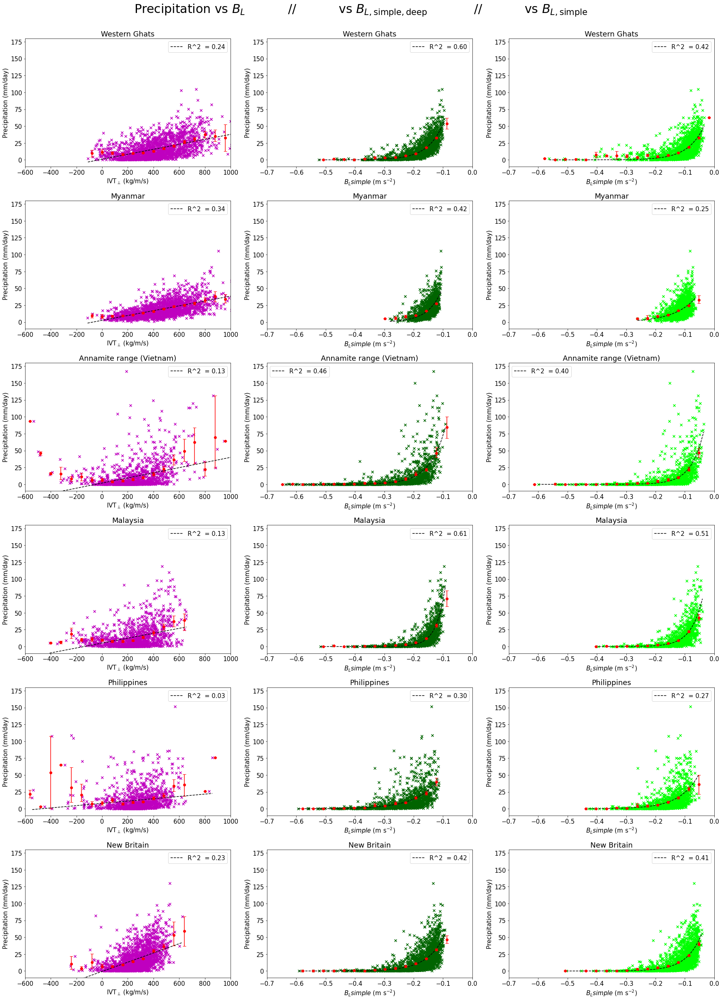

In [29]:
%%time
fig,axs = plt.subplots(6,3,figsize=(25,35))
for j,MR in enumerate(MRs):
    pr = MR.vars['GPM_PR_ABOVE_DAILY']
    viwvperp = MR.vars['VIWV_PERP_UPSTREAM_DAILY']
    Blsimple = MR.vars['BLSIMPLE_ABOVE_DAILY']
    Blsimpledeep = MR.vars['BLDEEPSIMPLE_ABOVE_DAILY']
    
    for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Blsimpledeep,Blsimple),('m','darkgreen','lime'),('linear','exponential','exponential'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
        axs[j,i].scatter(pred,pr,marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[j,i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        centers,means,q02,q98 = get_binned(pred,pr,bins,bootstrap=True)
        #axs[j,i].plot(centers,means,'or')
        axs[j,i].errorbar(centers,means,yerr=[means-q02,q98-means],fmt='or',ecolor='r',capsize=4)
        
        axs[j,i].set_ylabel("Precipitation (mm/day)")
        axs[j,i].set_title(MR.Lname)
        axs[j,i].legend()
        axs[j,i].set_ylim(-10,180)
    axs[j,0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[j,1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[j,2].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[j,0].set_xlim(-600,1000)
    axs[j,1].set_xlim(-0.7,0)
    axs[j,2].set_xlim(-0.7,0)

       
fig.suptitle(r"Precipitation vs $B_L$           //           vs $B_{L,\mathrm{simple,deep}}$            //           vs $B_{L,\mathrm{simple}}$",fontsize=30)
fig.tight_layout(rect=[0, 0, 1, 0.98])

## At each grid cell

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as 

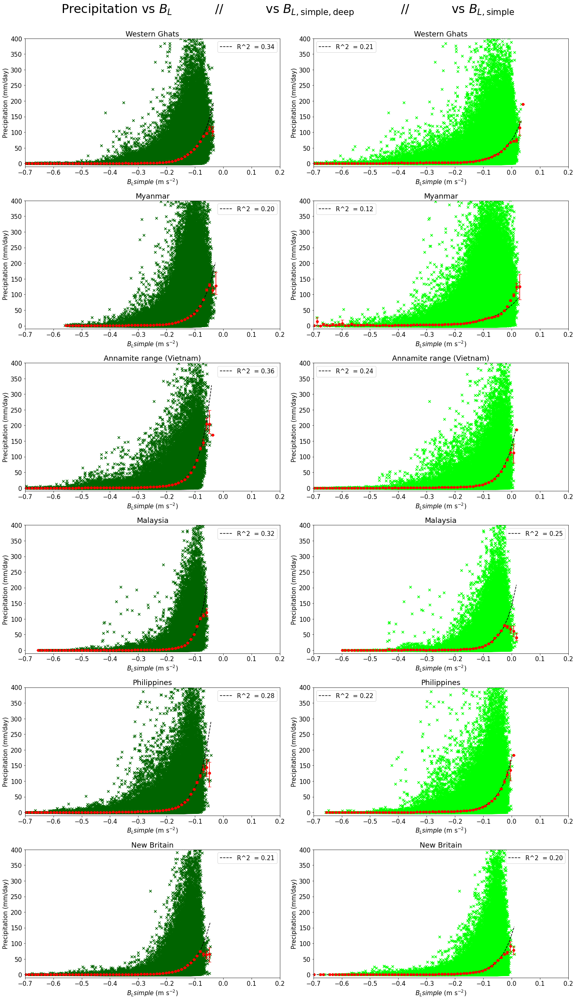

In [30]:
#%%time
fig,axs = plt.subplots(6,2,figsize=(20,35))
for j,MR in enumerate(MRs):
    mask = tilted_rect(MR.vars['BLSIMPLE_DAILY'],*MR.box_tilted,reverse=False)
    Blsimple = MR.vars['BLSIMPLE_DAILY'].where(mask)
    Blsimpledeep = MR.vars['BLDEEPSIMPLE_DAILY'].where(mask)
    pr = MR.vars['GPM_PR_DAILY'].transpose('time','latitude','longitude').interp_like(Blsimple[0]).where(mask)
    pr = np.array(pr).reshape(-1)
    idx = ~np.isnan(pr)
    pr = pr[idx]
    Blsimple = np.array(Blsimple).reshape(-1)[idx]
    Blsimpledeep = np.array(Blsimpledeep).reshape(-1)[idx]
    
    for i,(pred,c,model,bins) in enumerate(zip((Blsimpledeep,Blsimple),('darkgreen','lime'),('exponential','exponential'),(np.linspace(-1,0.1,101),np.linspace(-1,0.1,101)))):
        axs[j,i].scatter(pred,pr,marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[j,i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        centers,means,q02,q98 = get_binned(pred,pr,bins,bootstrap=True)
        axs[j,i].errorbar(centers,means,yerr=[means-q02,q98-means],fmt='or',ecolor='r',capsize=4)
        
        axs[j,i].set_ylabel("Precipitation (mm/day)")
        axs[j,i].set_title(MR.Lname)
        axs[j,i].legend()
        axs[j,i].set_ylim(-10,400)
    axs[j,0].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[j,1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[j,0].set_xlim(-0.7,0.2)
    axs[j,1].set_xlim(-0.7,0.2)

       
fig.suptitle(r"Precipitation vs $B_L$           //           vs $B_{L,\mathrm{simple,deep}}$            //           vs $B_{L,\mathrm{simple}}$",fontsize=30)
fig.tight_layout(rect=[0, 0, 1, 0.98])

# Precip predictor

In [19]:
alpha = 20.6/3600*2.5e6
dBLdqL = 1/(11.3*3600)*1004*8000/alpha
dBLdTL = -1/(2.7*3600)*1004*8000/alpha
dBLdeb = 1/(11.5*3600)*1004*8000/alpha

## Daily scale

In [32]:
Ghats.box_wind = [68,71,14,16]
Myanmar.box_wind=[91,94,12,15]
Vietnam.box_wind=[111,114,17,20]
Malaysia.box_wind=[103,105,6,8]
Philippines.box_wind = [123,126,17,19]
Newbritain.box_wind=[150,153,-10,-8]

def plot_box(ax,box,c='b'):
    ax.add_patch(mpatches.Rectangle(xy=[box[0], box[2]], width=box[1]-box[0], height=box[3]-box[2],
                                   edgecolor=c,
                                   fill = False,
                                   lw=1.5,
                                   linestyle='--',
                                   transform=ccrs.PlateCarree()))
    


### Shallow $B_L$

Text(0.5, 0.98, 'VAR_100U_PERP_DAILY regressed onto BL_LOWERTROP_DAILY')

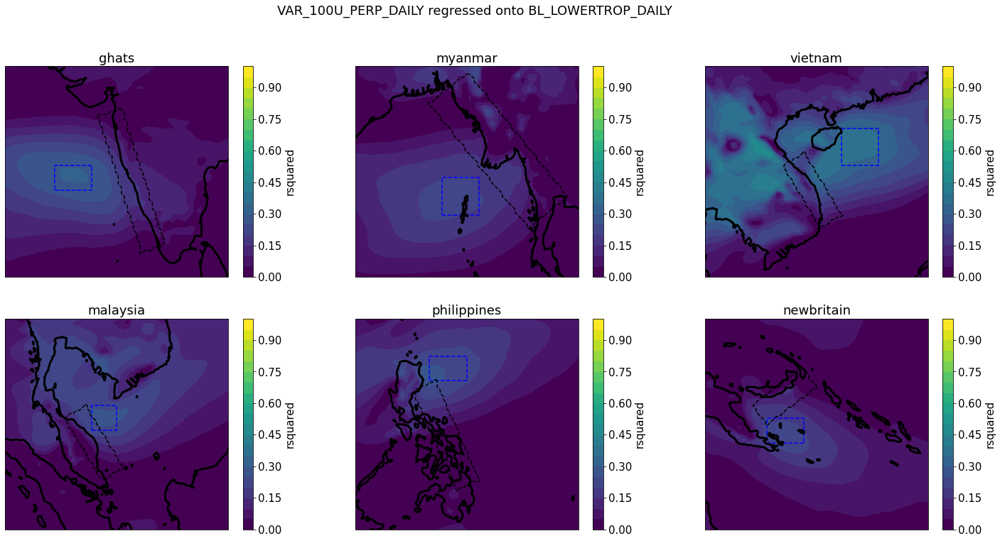

In [82]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'VAR_100U_PERP_DAILY'
cm = plt.cm.viridis
levs = np.linspace(0,1,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = MR.vars[varname]
    
    rsq = linregress_xr_2(pred,var).rsquared
    rsq*=(rsq>=0)
    rsq.transpose('latitude','longitude').plot.contourf(ax=ax,cmap=cm,levels=levs)

    ax.coastlines(linewidth=3)
    tilted_rect(rsq,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.set_title(MR.name)
    plot_box(ax,MR.box_wind)
fig.suptitle(varname + ' regressed onto ' + predname)
     

[ 0.00863208 -0.09180494]
[ 0.00415109 -0.03564528]
[ 0.01114112 -0.09528587]
[ 0.00629507 -0.0339887 ]
[ 0.00571228 -0.04927439]
[ 0.00783843 -0.06118956]


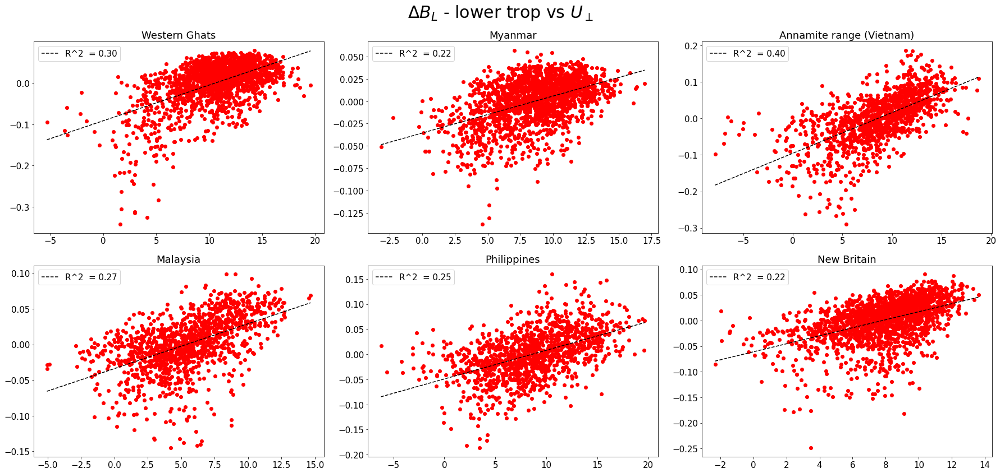

In [33]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    wind = sel_box(MR.vars['VAR_100U_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude'))
    
    axs[i].scatter(wind,predqL+predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(wind),np.array(predqL+predTL),'linear')
    MR.linear_coefs_windBL = popt
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    print(popt)
    
fig.suptitle(r"$\Delta B_L$ - lower trop vs $U_\perp$",fontsize=30)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/g

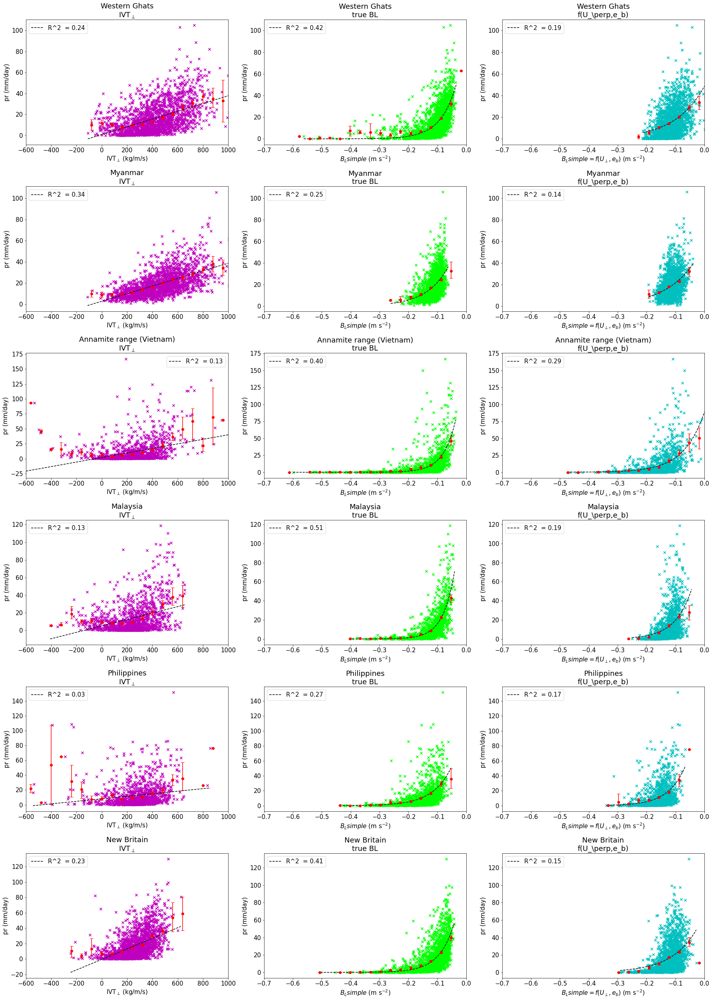

In [35]:
fig,axss = plt.subplots(6,3,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    pr = MR.vars['GPM_PR_ABOVE_DAILY']
    viwvperp = MR.vars['VIWV_PERP_UPSTREAM_DAILY']
    Bl_above = MR.vars['BLSIMPLE_ABOVE_DAILY']
    Bl_rce = Bl_above.mean('time')
    
    wind = sel_box(MR.vars['VAR_100U_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude'))
    predL=MR.linear_coefs_windBL[0]*wind + MR.linear_coefs_windBL[1]
    predeb = dBLdeb*(MR.vars['EB_ABOVE_DAILY']-MR.vars['EB_ABOVE_DAILY'].mean('time'))
    
    for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb),('m','lime','c'),('linear','exponential','exponential'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
        axs[i].scatter(np.array(pred),np.array(pr),marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        centers,means,q02,q98 = get_binned(pred,pr,bins,bootstrap=True)
        axs[i].errorbar(centers,means,yerr=[means-q02,q98-means],fmt='or',ecolor='r',capsize=4)
        
        axs[i].set_ylabel(r"pr (mm/day)")
        axs[i].legend()
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[2].set_xlabel(r"$B_Lsimple = f(U_\perp,e_b)$ (m s$^{-2}$)")
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + r"f(U_\perp,e_b)")
    axs[0].set_xlim(-600,1000)
    axs[1].set_xlim(-0.7,0)
    axs[2].set_xlim(-0.7,0)
    
fig.tight_layout()


        

### Deep $B_L$

Text(0.5, 0.98, 'U900_PERP_DAILY regressed onto BL_LOWERTROP_DAILY')

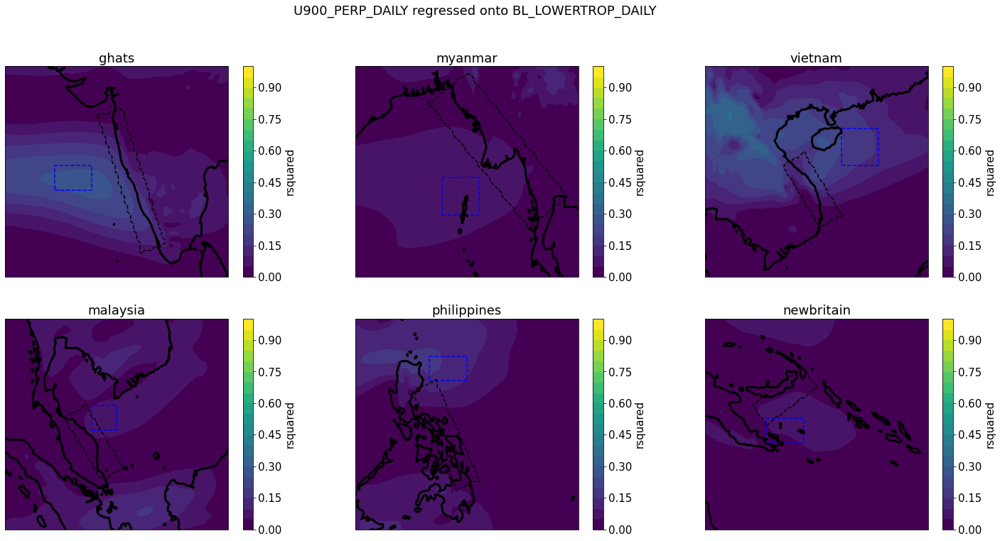

In [22]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'U900_PERP_DAILY'
cm = plt.cm.viridis
levs = np.linspace(0,1,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = MR.vars[varname]
    
    rsq = linregress_xr_2(pred,var).rsquared
    rsq*=(rsq>=0)
    rsq.transpose('latitude','longitude').plot.contourf(ax=ax,cmap=cm,levels=levs)

    ax.coastlines(linewidth=3)
    tilted_rect(rsq,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.set_title(MR.name)
    plot_box(ax,MR.box_wind)
fig.suptitle(varname + ' regressed onto ' + predname)
     

[ 0.00432128 -0.06362966]
[ 0.0017397  -0.01944286]
[ 0.00620094 -0.05251452]
[ 0.00219292 -0.01594144]
[ 0.00494251 -0.04201506]
[ 0.0037937 -0.0259053]


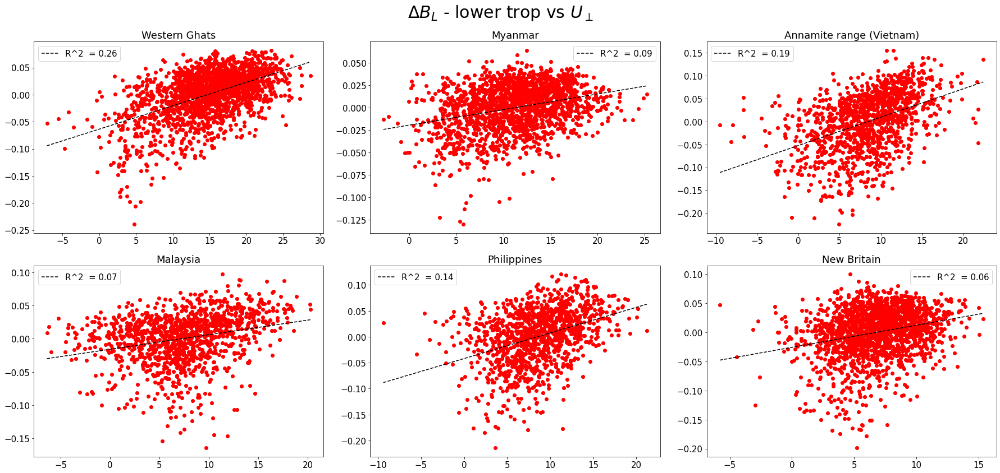

In [24]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
    wind = sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude'))
    
    axs[i].scatter(wind,predqL+predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(wind),np.array(predqL+predTL),'linear')
    MR.linear_coefs_windBLdeep = popt
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    print(popt)
    
fig.suptitle(r"$\Delta B_L$ - lower trop vs $U_\perp$",fontsize=30)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


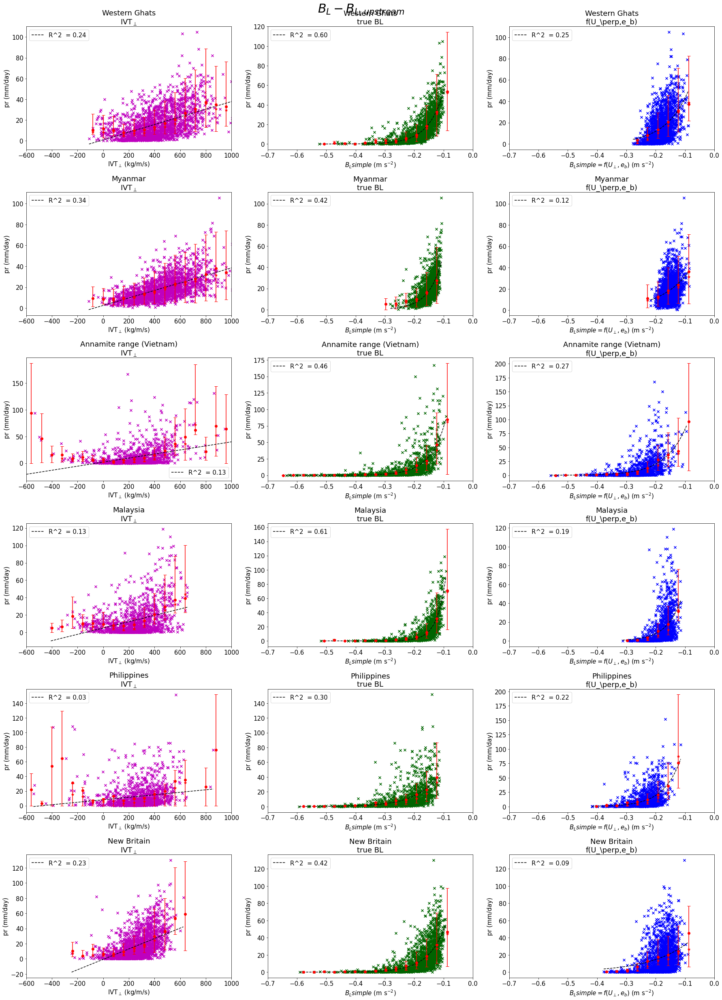

In [25]:
fig,axss = plt.subplots(6,3,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    pr = MR.vars['GPM_PR_ABOVE_DAILY']
    viwvperp = MR.vars['VIWV_PERP_UPSTREAM_DAILY']
    Bl_above = MR.vars['BLDEEPSIMPLE_ABOVE_DAILY']
    Bl_rce = Bl_above.mean('time')
    
    wind = sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude'))
    predL=MR.linear_coefs_windBLdeep[0]*wind + MR.linear_coefs_windBLdeep[1]
    predeb = dBLdeb*(MR.vars['EBDEEP_ABOVE_DAILY']-MR.vars['EBDEEP_ABOVE_DAILY'].mean('time'))
    
    for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb),('m','darkgreen','b'),('linear','exponential','exponential'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
        axs[i].scatter(np.array(pred),np.array(pr),marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        centers,means,meds,q1s,q2s = get_binned(pred,pr,bins,itq=True)
        axs[i].plot(centers,means,'or')
        axs[i].errorbar(centers,meds,yerr=[q1s,q2s],fmt='*r',ecolor='r',capsize=4)
        axs[i].set_ylabel(r"pr (mm/day)")
        axs[i].legend()
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[2].set_xlabel(r"$B_Lsimple = f(U_\perp,e_b)$ (m s$^{-2}$)")
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + r"f(U_\perp,e_b)")
    axs[0].set_xlim(-600,1000)
    axs[1].set_xlim(-0.7,0)
    axs[2].set_xlim(-0.7,0)
    
fig.suptitle(r"$B_L-B_{L,upstream}$",fontsize=30)
fig.tight_layout()


        

## 3-daily scale

### Shallow $B_L$

Text(0.5, 0.98, 'VAR_100U_PERP_DAILY regressed onto BL_LOWERTROP_DAILY')

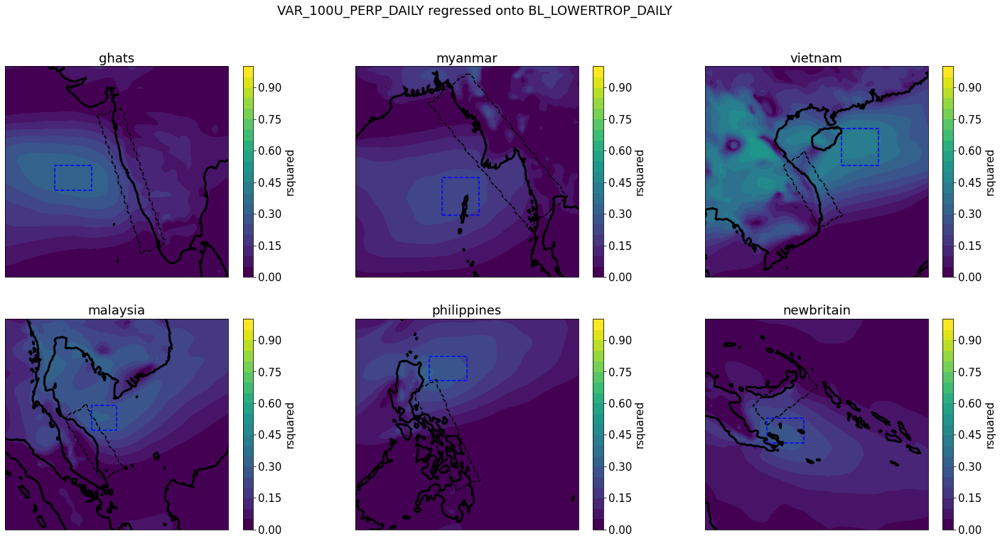

In [44]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'VAR_100U_PERP_DAILY'
cm = plt.cm.viridis
levs = np.linspace(0,1,21)
for (ax,MR) in zip(axs,MRs):
    predqL = resample_ndaily(dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. )
    predTL = resample_ndaily(dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time')))
    pred = predqL+predTL
    
    var = resample_ndaily(MR.vars[varname])
    
    rsq = linregress_xr_2(pred,var).rsquared
    rsq*=(rsq>=0)
    rsq.transpose('latitude','longitude').plot.contourf(ax=ax,cmap=cm,levels=levs)

    ax.coastlines(linewidth=3)
    tilted_rect(rsq,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.set_title(MR.name)
    plot_box(ax,MR.box_wind)
fig.suptitle(varname + ' regressed onto ' + predname)
     

[ 0.00959265 -0.10256835]
[ 0.00420906 -0.03624818]
[ 0.01165453 -0.09964848]
[ 0.00633228 -0.03426394]
[ 0.0062094  -0.05300898]
[ 0.00795915 -0.06236812]


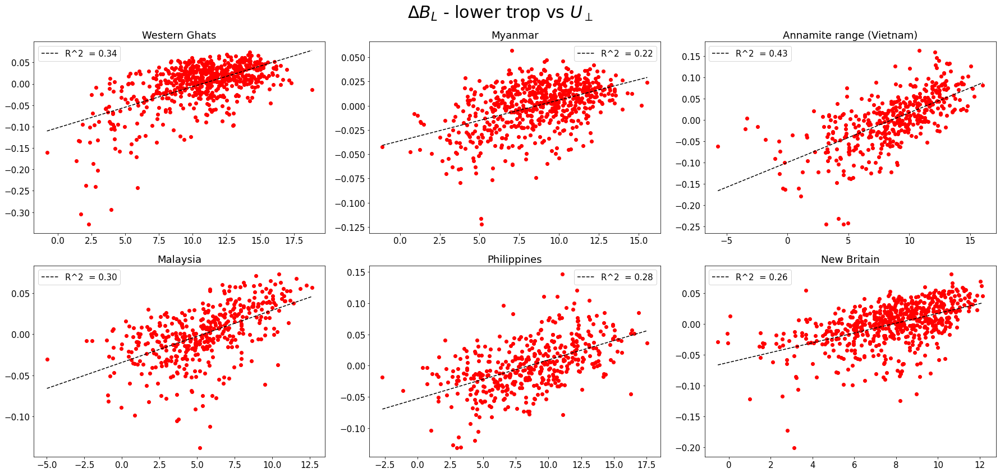

In [36]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    predqL = resample_ndaily(dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. )
    predTL = resample_ndaily(dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time')))
    wind   = resample_ndaily(sel_box(MR.vars['VAR_100U_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude')))
    
    axs[i].scatter(wind,predqL+predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(wind),np.array(predqL+predTL),'linear')
    MR.linear_coefs_windBLndaily = popt
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    print(popt)
    
fig.suptitle(r"$\Delta B_L$ - lower trop vs $U_\perp$",fontsize=30)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/g

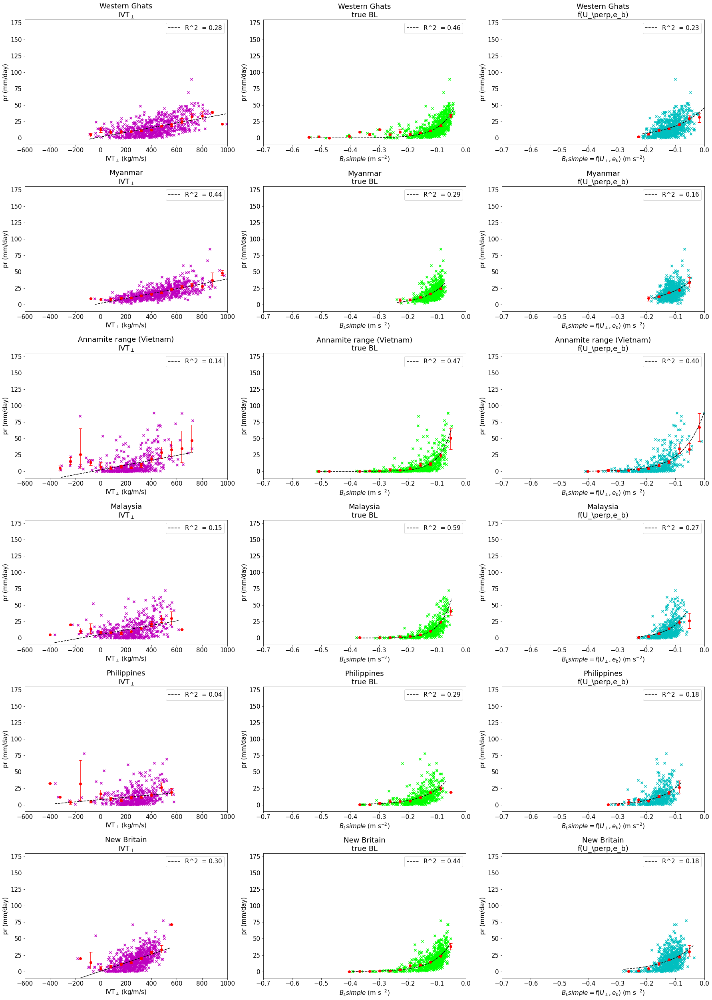

In [37]:
fig,axss = plt.subplots(6,3,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    pr       = resample_ndaily(MR.vars['GPM_PR_ABOVE_DAILY'])
    viwvperp = resample_ndaily(MR.vars['VIWV_PERP_UPSTREAM_DAILY'])
    Bl_above = resample_ndaily(MR.vars['BLSIMPLE_ABOVE_DAILY'])
    Bl_rce   = Bl_above.mean('time')
    
    wind   = resample_ndaily(sel_box(MR.vars['VAR_100U_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude')))
    predL  = MR.linear_coefs_windBLndaily[0]*wind + MR.linear_coefs_windBLndaily[1]
    predeb = resample_ndaily(dBLdeb*(MR.vars['EB_ABOVE_DAILY']-MR.vars['EB_ABOVE_DAILY'].mean('time')))
    
    for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb),('m','lime','c'),('linear','exponential','exponential'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
        axs[i].scatter(np.array(pred),np.array(pr),marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        centers,means,q02,q98 = get_binned(pred,pr,bins,bootstrap=True)
        axs[i].errorbar(centers,means,yerr=[means-q02,q98-means],fmt='or',ecolor='r',capsize=4)
        axs[i].set_ylabel(r"pr (mm/day)")
        axs[i].set_ylim(-10,180)
        axs[i].legend()
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[2].set_xlabel(r"$B_Lsimple = f(U_\perp,e_b)$ (m s$^{-2}$)")
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + r"f(U_\perp,e_b)")
    axs[0].set_xlim(-600,1000)
    axs[1].set_xlim(-0.7,0)
    axs[2].set_xlim(-0.7,0)
    
fig.tight_layout()


        

## pentads

Text(0.5, 0.98, 'VAR_100U_PERP_DAILY regressed onto BL_LOWERTROP_DAILY')

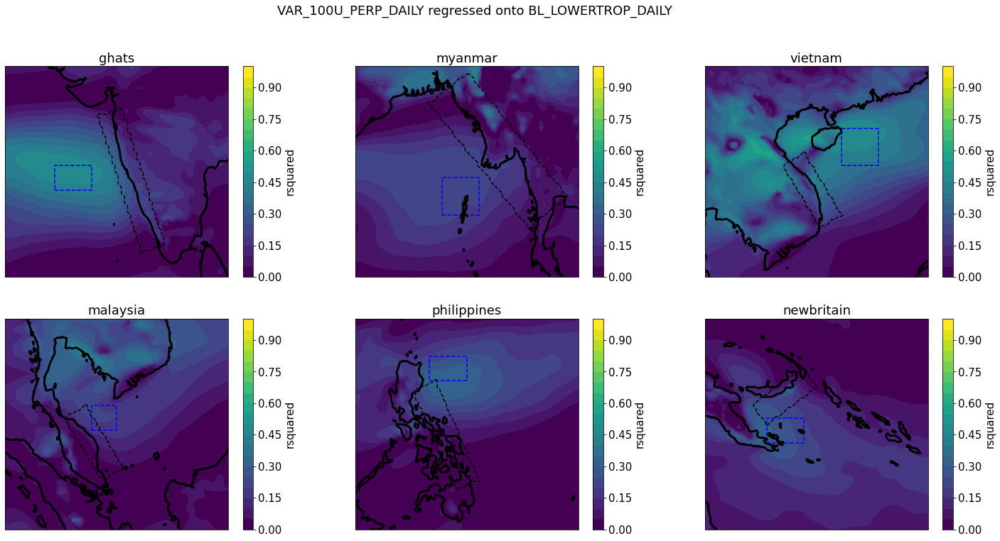

In [40]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'VAR_100U_PERP_DAILY'
cm = plt.cm.viridis
levs = np.linspace(0,1,21)
for (ax,MR) in zip(axs,MRs):
    predqL = resample_ndaily(dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. ,15)
    predTL = resample_ndaily(dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time')),15)
    pred = predqL+predTL
    
    var = resample_ndaily(MR.vars[varname],15)
    
    rsq = linregress_xr_2(pred,var).rsquared
    rsq*=(rsq>=0)
    rsq.transpose('latitude','longitude').plot.contourf(ax=ax,cmap=cm,levels=levs)

    ax.coastlines(linewidth=3)
    tilted_rect(rsq,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.set_title(MR.name)
    plot_box(ax,MR.box_wind)
fig.suptitle(varname + ' regressed onto ' + predname)
     

[ 0.01367172 -0.14652476]
[ 0.00494267 -0.0431732 ]
[ 0.01187874 -0.09808145]
[ 0.00539075 -0.02848149]
[ 0.00679464 -0.05637081]
[ 0.00807668 -0.06440102]


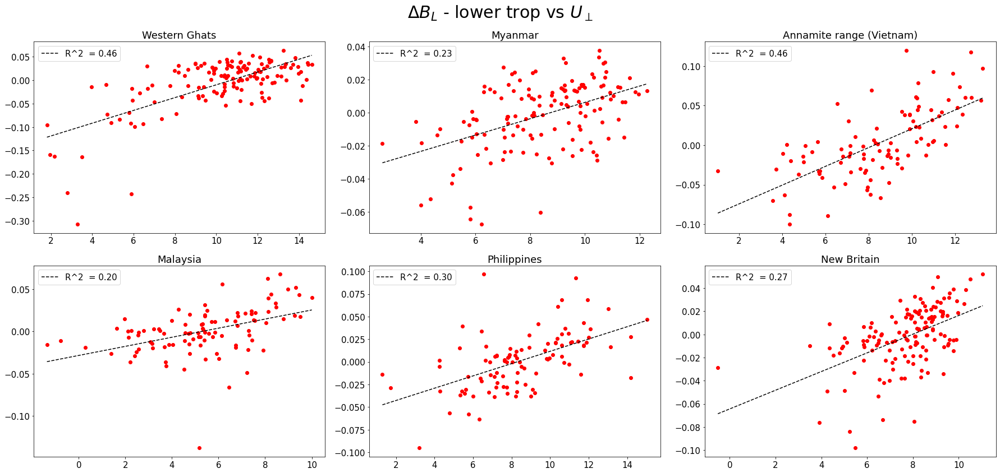

In [38]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    predqL = resample_ndaily(dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. ,15)
    predTL = resample_ndaily(dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time')),15)
    wind   = resample_ndaily(sel_box(MR.vars['VAR_100U_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude')),15)
    
    axs[i].scatter(wind,predqL+predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(wind),np.array(predqL+predTL),'linear')
    MR.linear_coefs_windBLpentad = popt
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    print(popt)
    
fig.suptitle(r"$\Delta B_L$ - lower trop vs $U_\perp$",fontsize=30)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice.
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app
/g

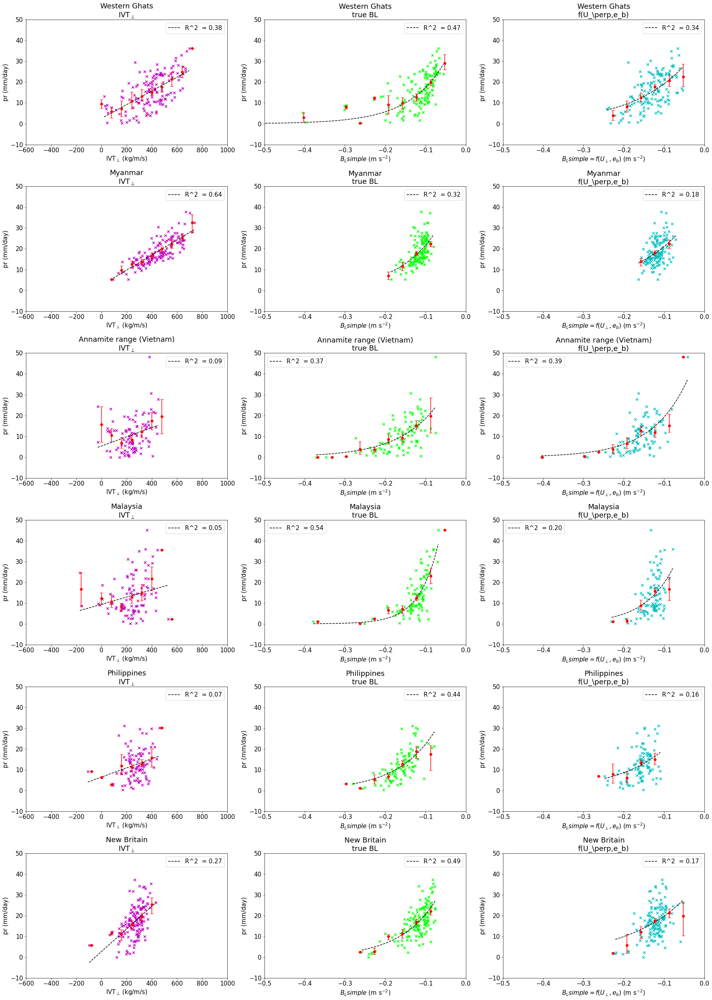

In [42]:
fig,axss = plt.subplots(6,3,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    pr       = resample_ndaily(MR.vars['GPM_PR_ABOVE_DAILY'],15)
    viwvperp = resample_ndaily(MR.vars['VIWV_PERP_UPSTREAM_DAILY'],15)
    Bl_above = resample_ndaily(MR.vars['BLSIMPLE_ABOVE_DAILY'],15)
    Bl_rce   = Bl_above.mean('time')
    
    wind   = resample_ndaily(sel_box(MR.vars['VAR_100U_PERP_DAILY'],MR.box_wind).mean(('latitude','longitude')),15)
    predL  = MR.linear_coefs_windBLpentad[0]*wind + MR.linear_coefs_windBLpentad[1]
    predeb = resample_ndaily(dBLdeb*(MR.vars['EB_ABOVE_DAILY']-MR.vars['EB_ABOVE_DAILY'].mean('time')),15)
    
    for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb),('m','lime','c'),('linear','exponential','exponential'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
        axs[i].scatter(np.array(pred),np.array(pr),marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        centers,means,q02,q98 = get_binned(pred,pr,bins,bootstrap=True)
        axs[i].errorbar(centers,means,yerr=[means-q02,q98-means],fmt='or',ecolor='r',capsize=4)
        axs[i].set_ylabel(r"pr (mm/day)")
        axs[i].set_ylim(-10,50)
        axs[i].legend()
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[2].set_xlabel(r"$B_Lsimple = f(U_\perp,e_b)$ (m s$^{-2}$)")
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + r"f(U_\perp,e_b)")
    axs[0].set_xlim(-600,1000)
    axs[1].set_xlim(-0.5,0)
    axs[2].set_xlim(-0.5,0)
    
fig.tight_layout()


        

## Monthly scale

In [12]:
Ghats.box_wind_monthly = [64,66,16,18]
Myanmar.box_wind_monthly=[89,91,15,17]
Vietnam.box_wind_monthly=[111,114,17,20]
Malaysia.box_wind_monthly=[107,109,7,9]
Philippines.box_wind_monthly = [123,126,17,19]
Newbritain.box_wind_monthly=[150,153,-8,-6]

Text(0.5, 0.98, 'U900_PERP_DAILY regressed onto BL_LOWERTROP_DAILY')

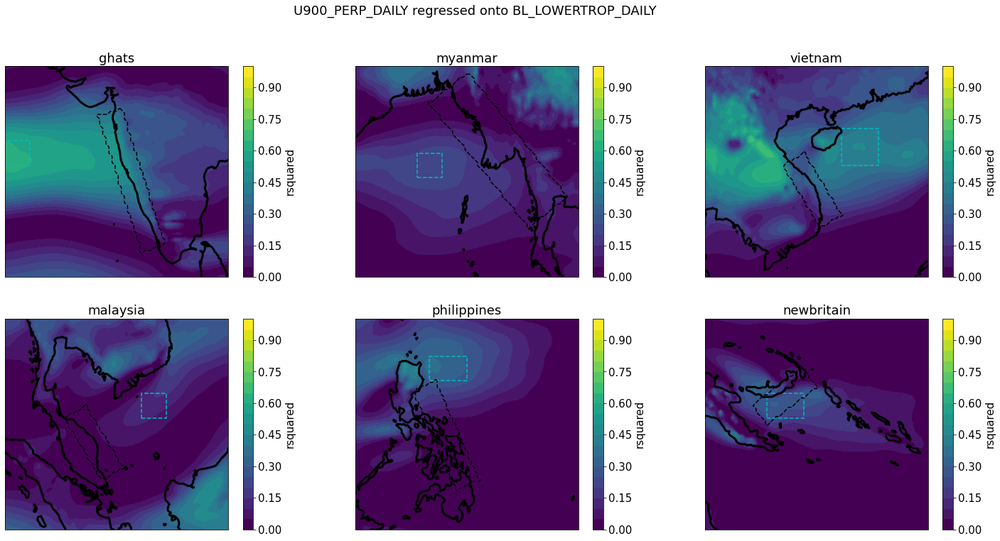

In [74]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'U900_PERP_DAILY'
cm = plt.cm.viridis
levs = np.linspace(0,1,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    var = MR.vars[varname]
    
    rsq = linregress_xr_2(resample_monthly(pred),resample_monthly(var)).rsquared
    rsq*=(rsq>=0)
    rsq.transpose('latitude','longitude').plot.contourf(ax=ax,cmap=cm,levels=levs)

    ax.coastlines(linewidth=3)
    tilted_rect(rsq,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.set_title(MR.name)
    plot_box(ax,MR.box_wind_monthly,'c')
fig.suptitle(varname + ' regressed onto ' + predname)
     

CPU times: user 2.15 s, sys: 391 ms, total: 2.54 s
Wall time: 2.41 s


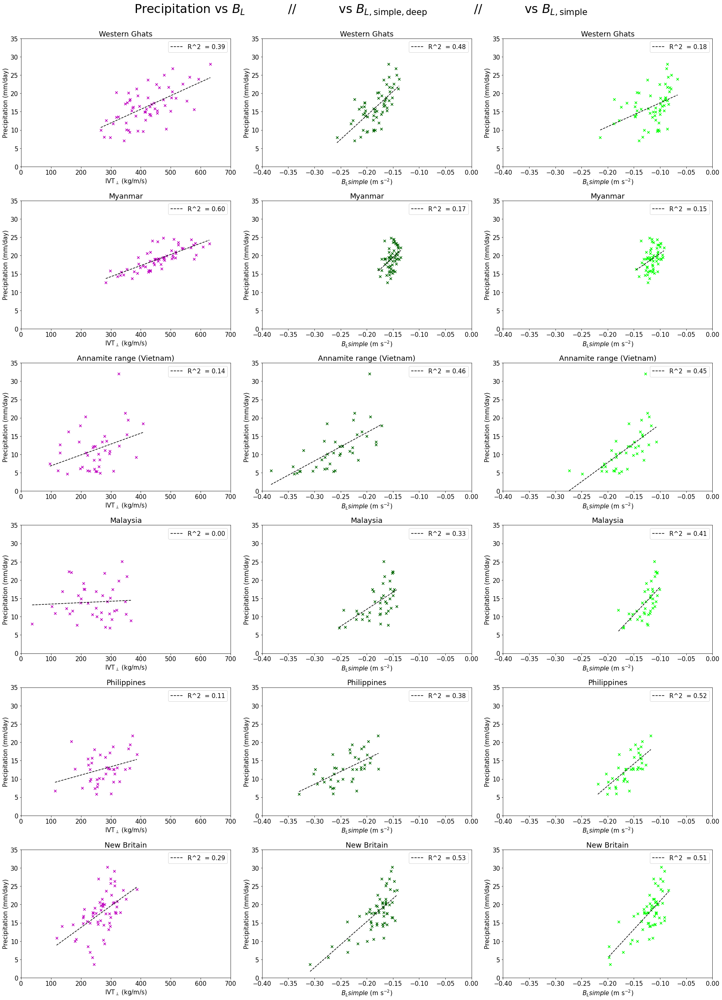

In [80]:
%%time
fig,axs = plt.subplots(6,3,figsize=(25,35))
for j,MR in enumerate(MRs):
    pr           = resample_monthly(MR.vars['GPM_PR_ABOVE_DAILY'])
    viwvperp     = resample_monthly(MR.vars['VIWV_PERP_UPSTREAM_DAILY'])
    Blsimple     = resample_monthly(MR.vars['BLSIMPLE_ABOVE_DAILY'])
    Blsimpledeep = resample_monthly(MR.vars['BLDEEPSIMPLE_ABOVE_DAILY'])
    
    for i,(pred,c,model) in enumerate(zip((viwvperp,Blsimpledeep,Blsimple),('m','darkgreen','lime'),('linear','linear','linear'))):
        axs[j,i].scatter(pred,pr,marker='x',color=c)
        x,y,rsq = fit(pred,pr,model)
        axs[j,i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
        axs[j,i].set_ylabel("Precipitation (mm/day)")
        axs[j,i].set_title(MR.Lname)
        axs[j,i].legend()
        axs[j,i].set_ylim(0,35)
    axs[j,0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[j,1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[j,2].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
    axs[j,0].set_xlim(0,700)
    axs[j,1].set_xlim(-0.4,0)
    axs[j,2].set_xlim(-0.4,0)

       
fig.suptitle(r"Precipitation vs $B_L$           //           vs $B_{L,\mathrm{simple,deep}}$            //           vs $B_{L,\mathrm{simple}}$",fontsize=30)
fig.tight_layout(rect=[0, 0, 1, 0.98])

### Shallow $B_L$

[ 0.00882393 -0.1427229 ]
[ 0.0037089  -0.04264482]
[ 0.01191952 -0.10089618]
[ 0.00189011 -0.01836961]
[ 0.00924956 -0.07878074]
[ 0.0084927  -0.04913068]


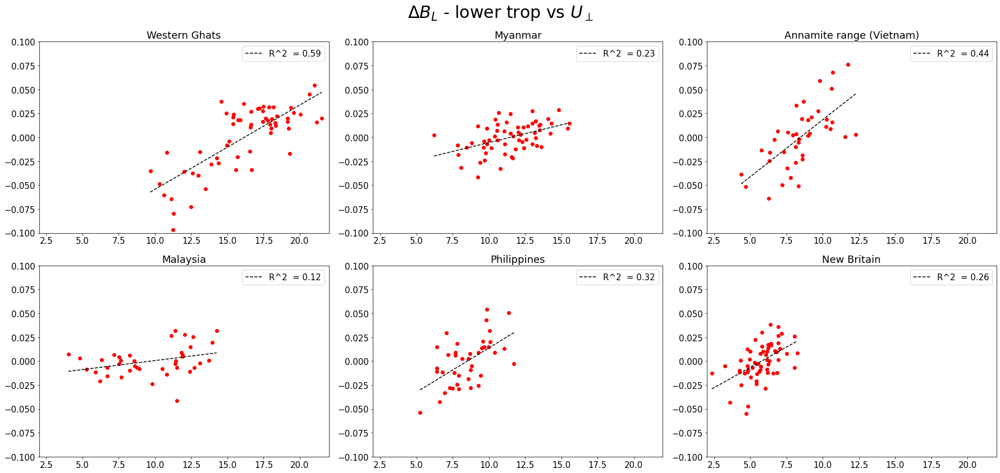

In [79]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    predqL = resample_monthly(dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. )
    predTL = resample_monthly(dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time')))
    wind =   resample_monthly(sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind_monthly).mean(('latitude','longitude')))
    
    axs[i].scatter(wind,predqL+predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(wind),np.array(predqL+predTL),'linear')
    MR.linear_coefs_windBL_monthly = popt
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    axs[i].set_xlim(2,22)
    axs[i].set_ylim(-0.1,0.1)
    print(popt)
    
fig.suptitle(r"$\Delta B_L$ - lower trop vs $U_\perp$",fontsize=30)
fig.tight_layout()

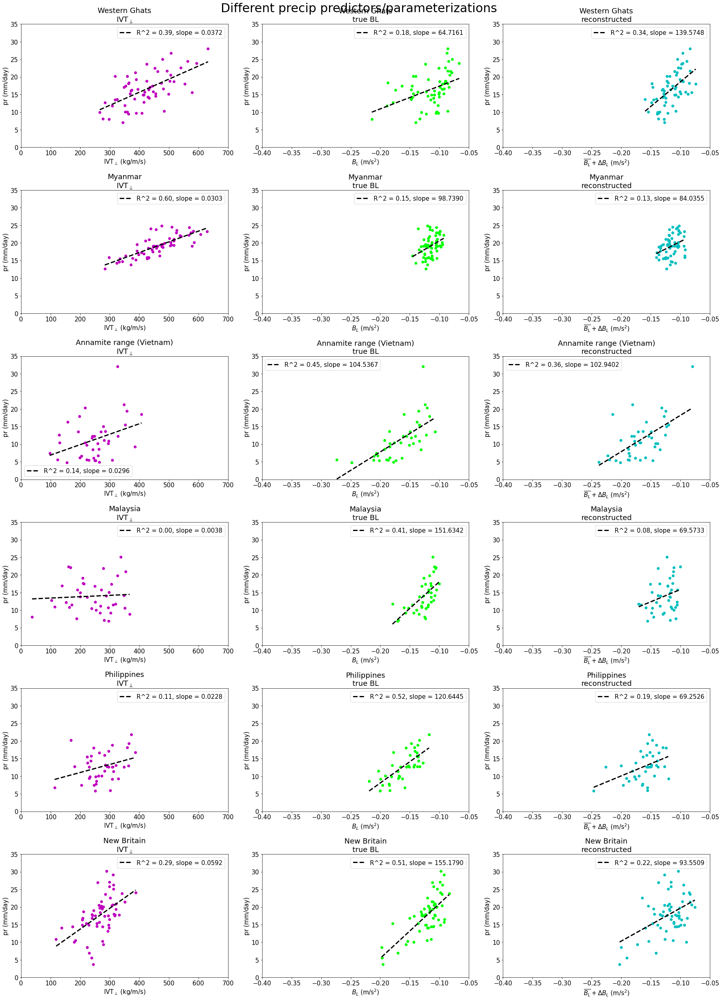

In [ ]:
fig,axss = plt.subplots(6,3,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    viwvperp = resample_monthly(MR.vars['VIWV_PERP_UPSTREAM_DAILY'])
    pr       = resample_monthly(MR.vars['GPM_PR_ABOVE_DAILY'])
    Bl_above = resample_monthly(MR.vars['BLSIMPLE_ABOVE_DAILY'])
    Bl_rce   = Bl_above.mean('time')
    
    wind   = resample_monthly(sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind_monthly).mean(('latitude','longitude')))
    predL  = resample_monthly(MR.linear_coefs_windBL_monthly[0]*wind + MR.linear_coefs_windBL_monthly[1])
    predeb = resample_monthly(dBLdeb*(MR.vars['EB_ABOVE_DAILY']-MR.vars['EB_ABOVE_DAILY'].mean('time')))
    
    for j,(pred,c) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb),('m','lime','c'))):
        x,y,rsq,popt = fit_coefs(np.array(pred),np.array(pr),'linear')
        axs[j].scatter(pred,pr,color=c)
        axs[j].plot(x,y,color='k',linewidth=3,linestyle='--',label = 'R^2 = %.2f, slope = %.4f'%(rsq,popt[0]))
        axs[j].set_ylabel(r"pr (mm/day)")
        axs[j].legend()
        axs[j].set_ylim(0,35)
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_L$ (m/s$^2$)")
    axs[2].set_xlabel(r"$\overline{B_L}+\Delta B_L$ (m/s$^2$)")
    axs[0].set_xlim(0,700)
    axs[1].set_xlim(-0.4,-0.05)
    axs[2].set_xlim(-0.4,-0.05)
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + "reconstructed")
    
fig.suptitle(r"Different precip predictors/parameterizations ",fontsize=30)
fig.tight_layout()

### Deep $B_L$

[ 0.00640637 -0.10361484]
[ 0.00326129 -0.03752288]
[ 0.00710889 -0.06026861]
[-0.00033422  0.00325511]
[ 0.00883909 -0.07519583]
[ 0.00814923 -0.0471524 ]


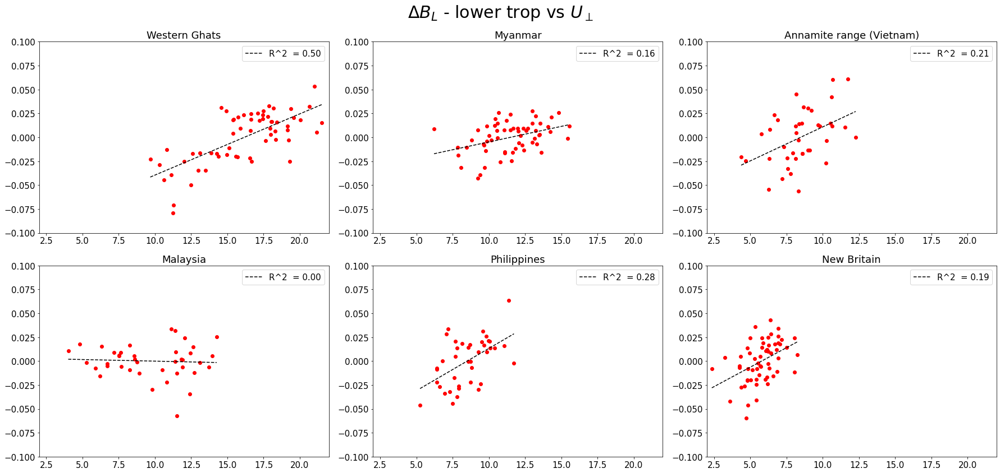

In [17]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    predqL = resample_monthly(dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. )
    predTL = resample_monthly(dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time')))
    wind =   resample_monthly(sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind_monthly).mean(('latitude','longitude')))
    
    axs[i].scatter(wind,predqL+predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(wind),np.array(predqL+predTL),'linear')
    MR.linear_coefs_windBLdeep_monthly = popt
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    axs[i].set_xlim(2,22)
    axs[i].set_ylim(-0.1,0.1)
    print(popt)
    
fig.suptitle(r"$\Delta B_L$ - lower trop vs $U_\perp$",fontsize=30)
fig.tight_layout()

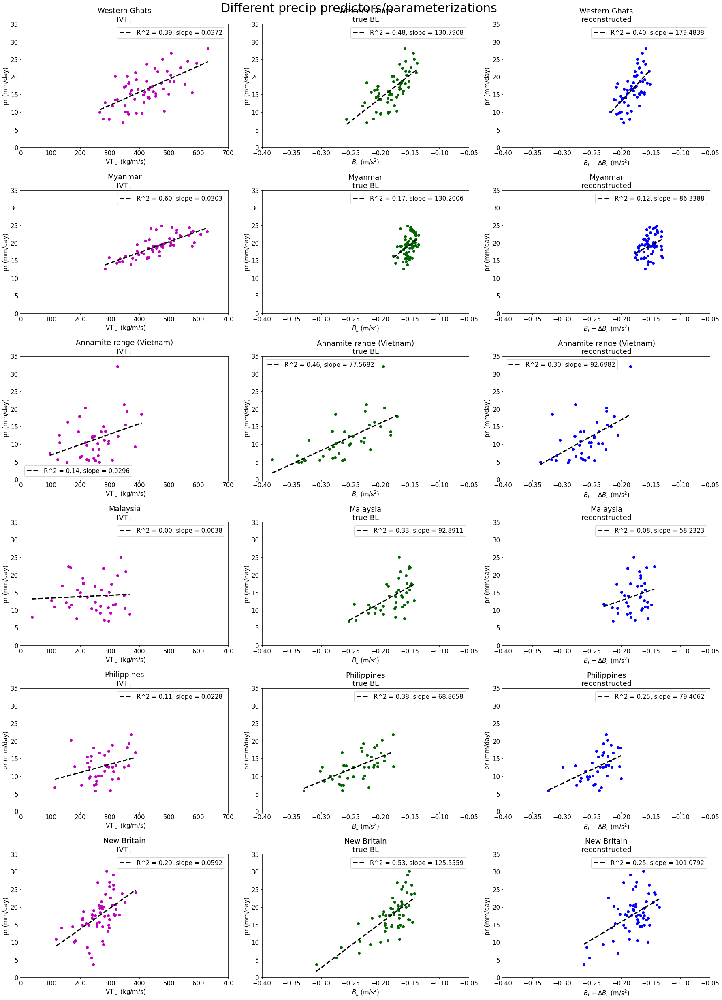

In [96]:
fig,axss = plt.subplots(6,3,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    viwvperp = resample_monthly(MR.vars['VIWV_PERP_UPSTREAM_DAILY'])
    pr       = resample_monthly(MR.vars['GPM_PR_ABOVE_DAILY'])
    Bl_above = resample_monthly(MR.vars['BLDEEPSIMPLE_ABOVE_DAILY'])
    Bl_rce   = Bl_above.mean('time')
    
    wind   = resample_monthly(sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind_monthly).mean(('latitude','longitude')))
    predL  = resample_monthly(MR.linear_coefs_windBLdeep_monthly[0]*wind + MR.linear_coefs_windBLdeep_monthly[1])
    predeb = resample_monthly(dBLdeb*(MR.vars['EBDEEP_ABOVE_DAILY']-MR.vars['EBDEEP_ABOVE_DAILY'].mean('time')))
    
    for j,(pred,c) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb),('m','darkgreen','b'))):
        x,y,rsq,popt = fit_coefs(np.array(pred),np.array(pr),'linear')
        axs[j].scatter(pred,pr,color=c)
        axs[j].plot(x,y,color='k',linewidth=3,linestyle='--',label = 'R^2 = %.2f, slope = %.4f'%(rsq,popt[0]))
        axs[j].set_ylabel(r"pr (mm/day)")
        axs[j].legend()
        axs[j].set_ylim(0,35)
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_L$ (m/s$^2$)")
    axs[2].set_xlabel(r"$\overline{B_L}+\Delta B_L$ (m/s$^2$)")
    axs[0].set_xlim(0,700)
    axs[1].set_xlim(-0.4,-0.05)
    axs[2].set_xlim(-0.4,-0.05)
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + "reconstructed")
    
fig.suptitle(r"Different precip predictors/parameterizations ",fontsize=30)
fig.tight_layout()

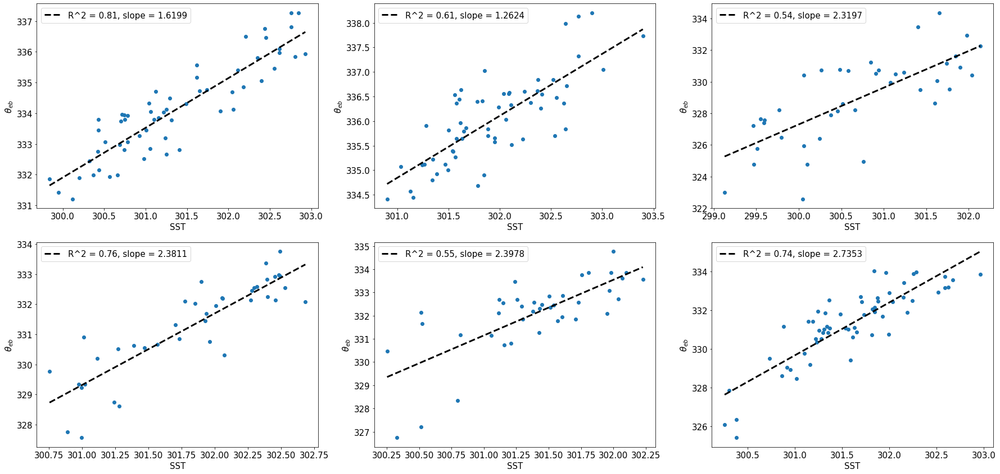

In [15]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    mask = tilted_rect(MR.vars['EBDEEP_DAILY'],*MR.box_tilted,reverse=False)
    thetaeb_timeseries = resample_monthly(spatial_mean(MR.vars['EBDEEP_DAILY'],box=None,mask=mask))
    sst_timeseries = spatial_mean(MR.vars['SST_3D'],box=None,mask=mask)
    sst_timeseries=sel_months(sst_timeseries,MR.months)
    axs[i].scatter(sst_timeseries,thetaeb_timeseries)
    axs[i].set_xlabel(r'SST');axs[i].set_ylabel(r'$\theta_{eb}$')
    x,y,rsq,popt = fit_coefs(np.array(sst_timeseries),np.array(thetaeb_timeseries),'linear')
    MR.linear_coefs_SSTebdeep_monthly = popt
    axs[i].plot(x,y,color='k',linewidth=3,linestyle='--',label = 'R^2 = %.2f, slope = %.4f'%(rsq,popt[0]))
    axs[i].legend()
    
fig.tight_layout()

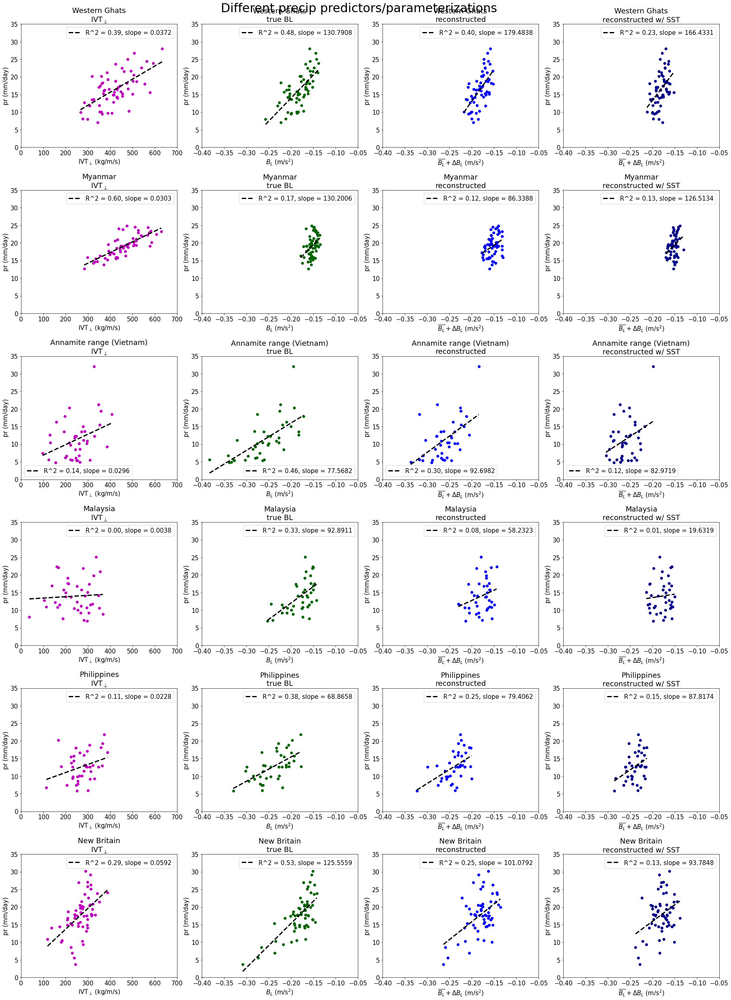

In [26]:
fig,axss = plt.subplots(6,4,figsize=(25,35))
for i,MR in enumerate(MRs):
    axs = axss[i]
    viwvperp = resample_monthly(MR.vars['VIWV_PERP_UPSTREAM_DAILY'])
    pr       = resample_monthly(MR.vars['GPM_PR_ABOVE_DAILY'])
    Bl_above = resample_monthly(MR.vars['BLDEEPSIMPLE_ABOVE_DAILY'])
    Bl_rce   = Bl_above.mean('time')
    
    wind   = resample_monthly(sel_box(MR.vars['U900_PERP_DAILY'],MR.box_wind_monthly).mean(('latitude','longitude')))
    predL  = resample_monthly(MR.linear_coefs_windBLdeep_monthly[0]*wind + MR.linear_coefs_windBLdeep_monthly[1])
    predeb = resample_monthly(dBLdeb*(MR.vars['EBDEEP_ABOVE_DAILY']-MR.vars['EBDEEP_ABOVE_DAILY'].mean('time')))
    
    mask = tilted_rect(MR.vars['SST_3D'],*MR.box_tilted,reverse=False)
    sst_timeseries = spatial_mean(MR.vars['SST_3D'],box=None,mask=mask)
    sst_timeseries = sel_months(sst_timeseries,MR.months)
    predebsst1 = MR.linear_coefs_SSTebdeep_monthly[0]*sst_timeseries + MR.linear_coefs_SSTebdeep_monthly[1]
    predebsst = np.array(dBLdeb*(predebsst1-MR.vars['EBDEEP_ABOVE_DAILY'].mean('time')))
    
    for j,(pred,c) in enumerate(zip((viwvperp,Bl_above,Bl_rce+predL+predeb,Bl_rce+predL+predebsst),('m','darkgreen','b','darkblue'))):
        x,y,rsq,popt = fit_coefs(np.array(pred),np.array(pr),'linear')
        axs[j].scatter(pred,pr,color=c)
        axs[j].plot(x,y,color='k',linewidth=3,linestyle='--',label = 'R^2 = %.2f, slope = %.4f'%(rsq,popt[0]))
        axs[j].set_ylabel(r"pr (mm/day)")
        axs[j].legend()
        axs[j].set_ylim(0,35)
    axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
    axs[1].set_xlabel(r"$B_L$ (m/s$^2$)")
    axs[2].set_xlabel(r"$\overline{B_L}+\Delta B_L$ (m/s$^2$)")
    axs[3].set_xlabel(r"$\overline{B_L}+\Delta B_L$ (m/s$^2$)")
    axs[0].set_xlim(0,700)
    axs[1].set_xlim(-0.4,-0.05)
    axs[2].set_xlim(-0.4,-0.05)
    axs[3].set_xlim(-0.4,-0.05)
    axs[0].set_title(MR.Lname + "\n" + r"IVT$_\perp$")
    axs[1].set_title(MR.Lname + "\n" + "true BL")
    axs[2].set_title(MR.Lname + "\n" + "reconstructed")
    axs[3].set_title(MR.Lname + "\n" + "reconstructed w/ SST")
    
fig.suptitle(r"Different precip predictors/parameterizations ",fontsize=30)
fig.tight_layout()

# Regressions

## $U_\perp$, $U_{//}$, $T$, $Q$, $e_b$, $PV$

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


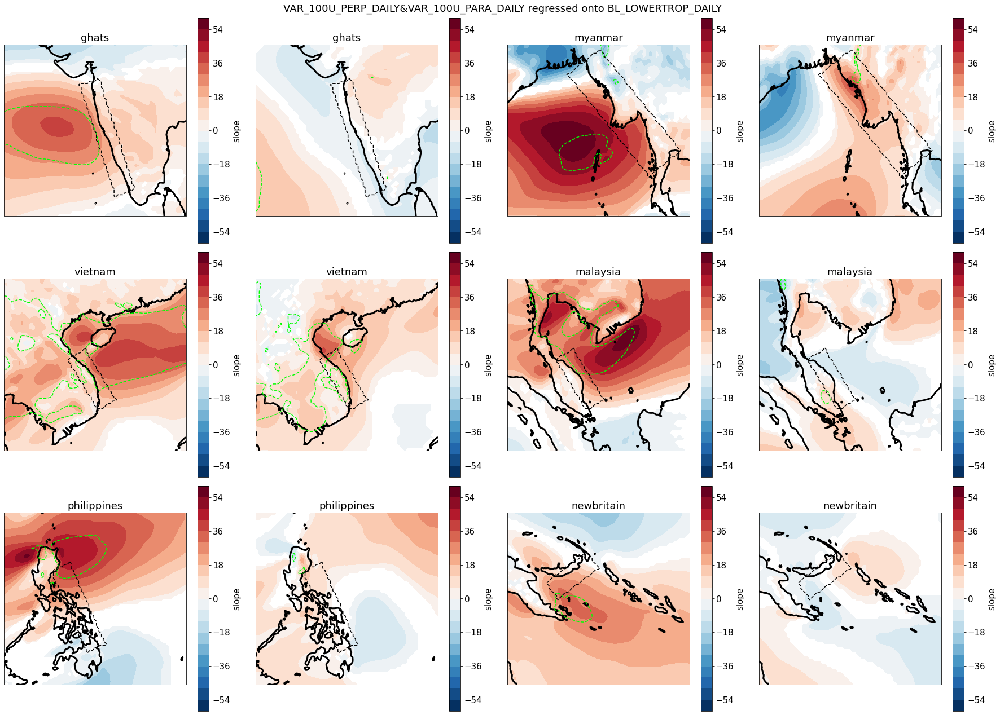

In [69]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.RdBu_r
levs = np.linspace(-60,60,21)
varnames = ['VAR_100U_PERP_DAILY','VAR_100U_PARA_DAILY']
for i,varname in enumerate(varnames):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        var = MR.vars[varname]
        
        reg = linregress_xr_2(pred,var)
    
        plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

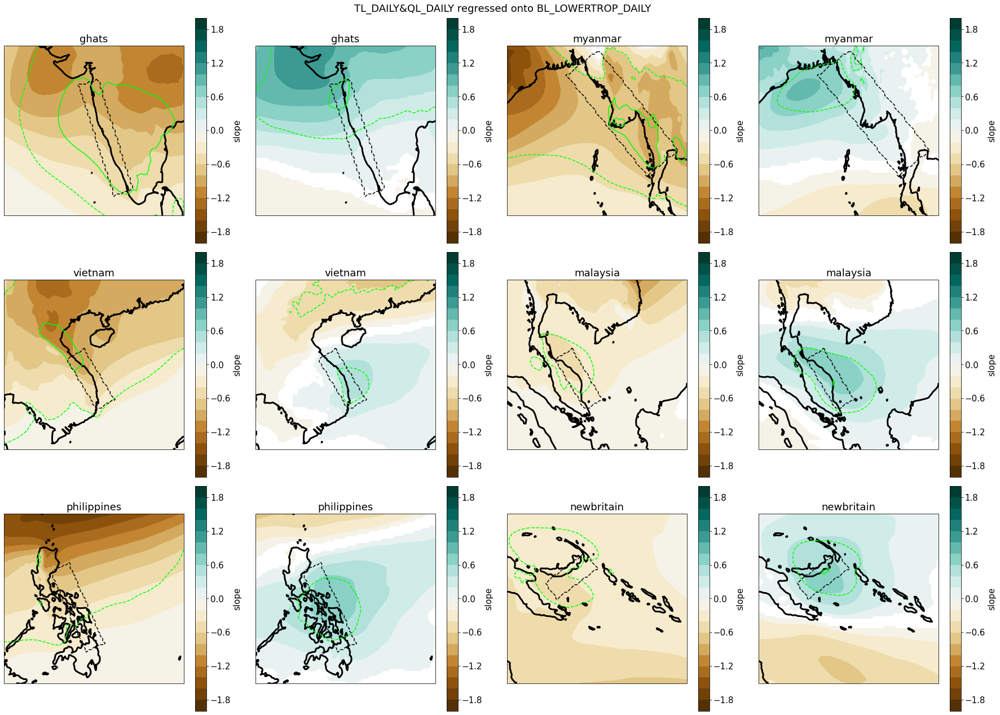

In [79]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.BrBG
levs = np.linspace(-2,2,21)
varnames = ['TL_DAILY','QL_DAILY']
for i,(varname,fact) in enumerate(zip(varnames,(-dBLdTL,dBLdqL*2.5e3))):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        var = fact*MR.vars[varname]
        
        reg = linregress_xr_2(pred,var)
    
        plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

Text(0.5, 0.98, 'BL_LOWERTROP_DAILY regressed onto BL_LOWERTROP_DAILY')

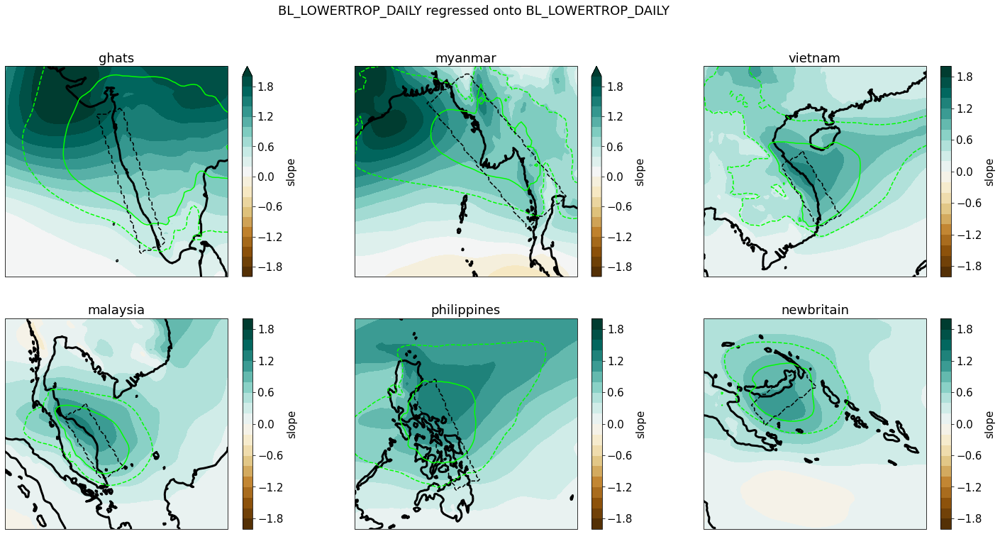

In [28]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.BrBG
levs = np.linspace(-2,2,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = dBLdTL*MR.vars['TL_DAILY'] + dBLdqL*2.5e3*MR.vars['QL_DAILY']
    
    reg = linregress_xr_2(pred,var)

    plot = reg.slope #* 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
    reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname + ' regressed onto ' + predname)
     

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


Text(0.5, 0.98, 'EB_DAILY regressed onto BL_LOWERTROP_DAILY')

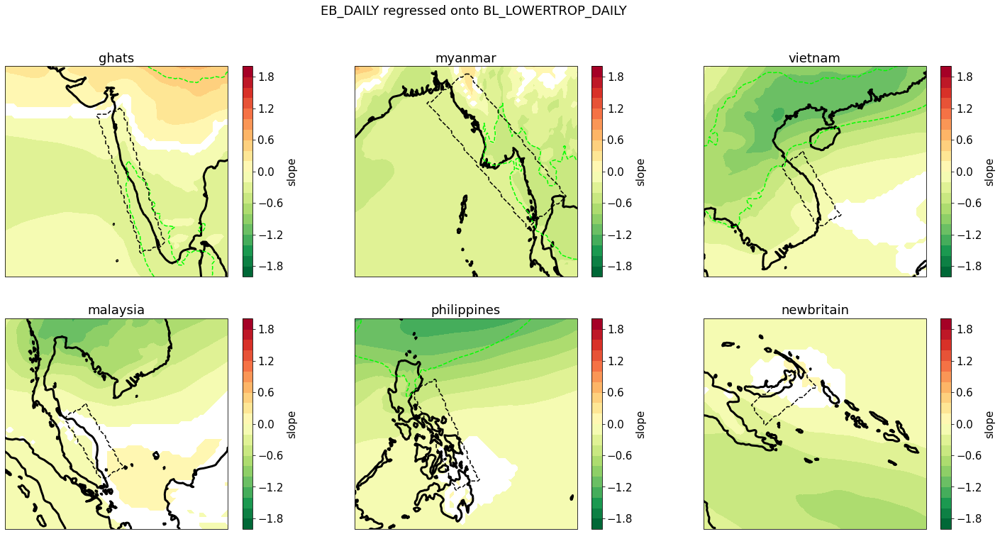

In [13]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'EB_DAILY'
cm = plt.cm.RdYlGn_r
levs = np.linspace(-2,2,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = dBLdeb*MR.vars[varname]
    
    reg = linregress_xr_2(pred,var)

    plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
    reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname + ' regressed onto ' + predname)
     

In [15]:
for MR in MRs:
    print(MR.name)
    MR.vars['PV_DAILY'] = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_060_pv.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name))


ghats
myanmar
vietnam
malaysia
philippines
newbritain


Text(0.5, 0.98, 'PV_DAILY$_{200}$ regressed onto BL_LOWERTROP_DAILY')

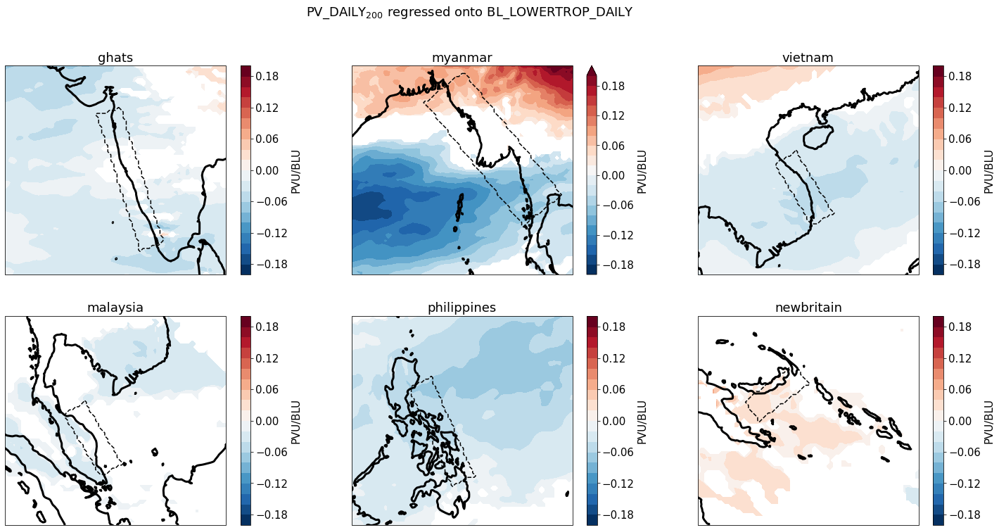

In [26]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'PV_DAILY'
cm = plt.cm.RdBu_r
levs = np.linspace(-0.2,0.2,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = MR.vars[varname].sel(level=200.)
    
    reg = linregress_xr_2(pred,var)

    plot = 1e5 * reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs,cbar_kwargs={'label':'PVU/BLU'})
    #reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname + r"$_{200}$"+ ' regressed onto ' + predname)
     

Text(0.5, 0.98, 'PV_DAILY$_{500}$ regressed onto BL_LOWERTROP_DAILY')

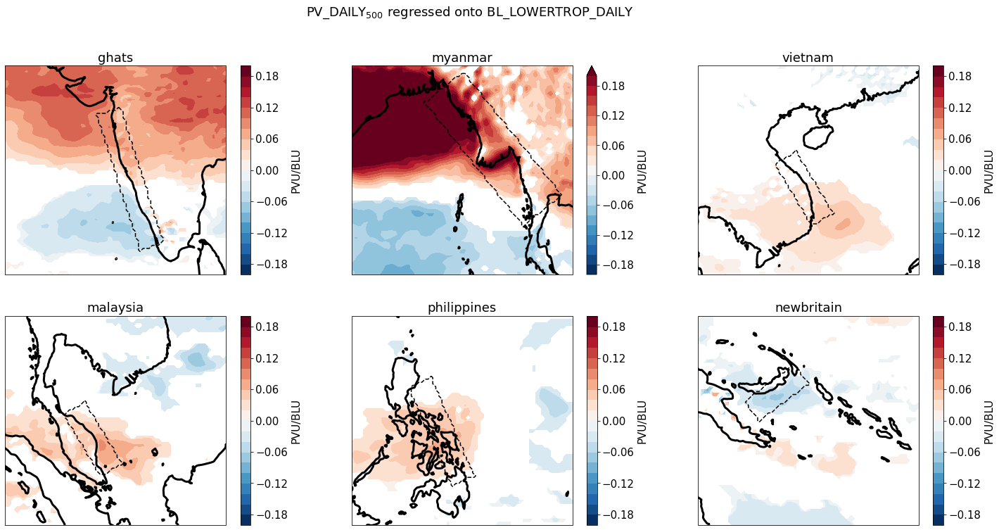

In [27]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BL_LOWERTROP_DAILY'
varname = 'PV_DAILY'
cm = plt.cm.RdBu_r
levs = np.linspace(-0.2,0.2,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = MR.vars[varname].sel(level=500.)
    
    reg = linregress_xr_2(pred,var)

    plot = 1e5 * reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs,cbar_kwargs={'label':'PVU/BLU'})
    #reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname +r"$_{500}$"+ ' regressed onto ' + predname)
     

## $ds/dz$, $dq/dz$

In [45]:
%%time
Newbritain.set_3dvar('PHI',"128_129_z")
sample_geopotential = Newbritain.vars['PHI'].mean(['latitude','longitude'])/9.81
dzdp = sample_geopotential.differentiate('level')

for MR in MRs:
    MR.vars['DQDZ_DAILY'] = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_133_q.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time').differentiate('level') * 2.5e6/1004. /dzdp
    MR.vars['DSDZ_DAILY'] = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_130_t.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time').differentiate('level') / dzdp + 9.81/1004.

CPU times: user 1min 7s, sys: 1min 29s, total: 2min 37s
Wall time: 2min 28s


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


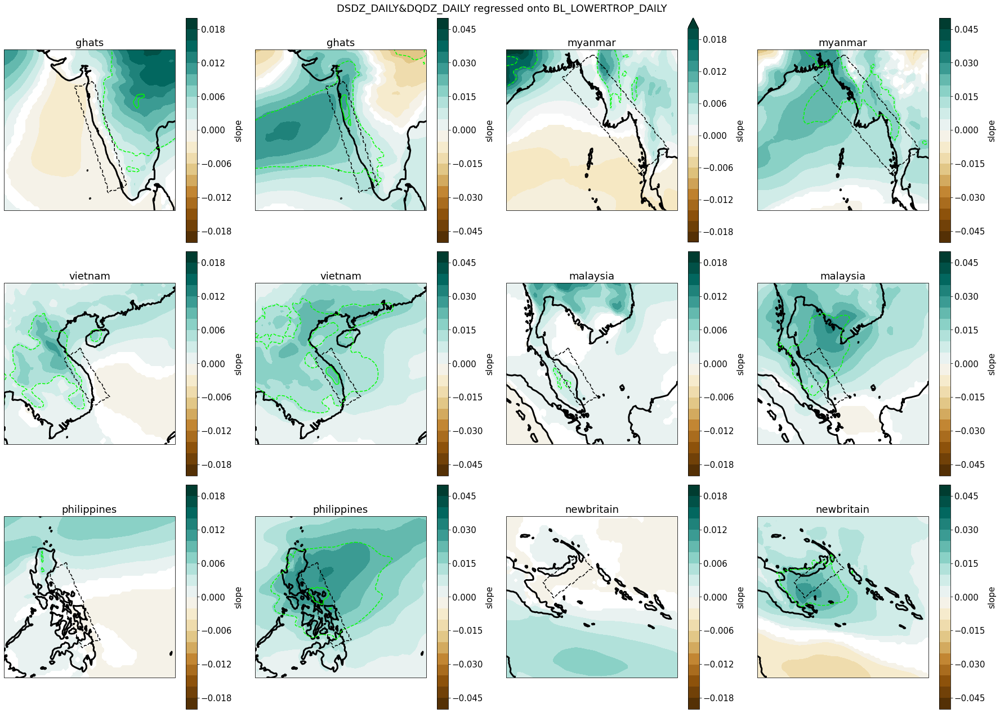

In [32]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.BrBG
varnames = ['DSDZ_DAILY','DQDZ_DAILY']
for i,(varname,levs) in enumerate(zip(varnames,(np.linspace(-0.02,0.02,21),np.linspace(-0.05,0.05,21)))):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        var = MR.vars[varname].sel(level=slice(700,900)).mean('level')
        
        reg = linregress_xr_2(pred,var)
    
        plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


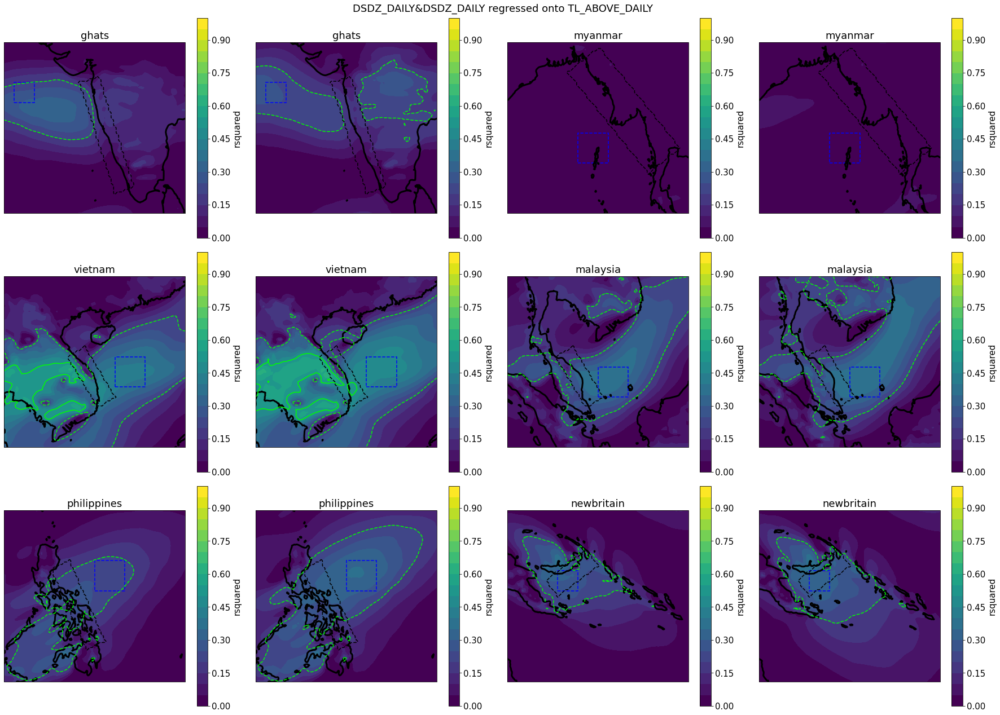

In [84]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'TL_ABOVE_DAILY'
cm = plt.cm.viridis

levs=np.linspace(0,1,21)
for i in range(2):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
        pred = predTL
        
        if i==0:
            var = MR.vars['VAR_100U_PERP_DAILY']
        else:
            #MR.vars['UDSDZ'] = MR.vars['VAR_100U_PERP_DAILY']*MR.vars['DSDZ_DAILY'].sel(level=slice(700,899)).mean('level')
            var = MR.vars['UDSDZ']
        reg = linregress_xr_2(pred,var)
    
        plot = reg.rsquared# * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        plot_box(ax,MR.box_winddsdz)
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

In [83]:
Ghats.box_winddsdz = [65,67,18,20]
Myanmar.box_winddsdz=[91,94,12,15]
Vietnam.box_winddsdz=[111,114,14,17]
Malaysia.box_winddsdz=[105,108,3,6]
Philippines.box_winddsdz = [126,129,14,17]
Newbritain.box_winddsdz=[150,152,-8,-6]


[ 0.83834882 -0.05823676]
[ 0.19432936 -0.00759487]
[ 2.10324418 -0.07571524]
[ 0.98621473 -0.02223057]
[ 1.04908078 -0.04437717]
[ 1.31209868 -0.04281831]


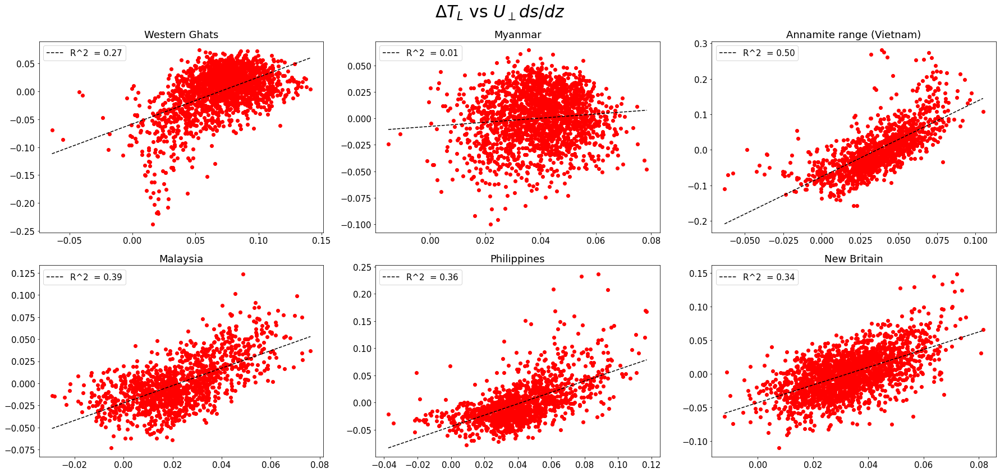

In [86]:
fig,axs = plt.subplots(2,3,figsize=(25,12))
axs=axs.reshape(-1)
for i,MR in enumerate(MRs):
    #predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    winddsdz = sel_box(MR.vars['UDSDZ'],MR.box_winddsdz).mean(('latitude','longitude'))
    
    axs[i].scatter(winddsdz,predTL,color='r')
    x,y,rsq,popt = fit_coefs(np.array(winddsdz),np.array(predTL),'linear')
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    print(popt)
    
fig.suptitle(r"$\Delta T_L$ vs $U_\perp ds/dz$",fontsize=30)
fig.tight_layout()

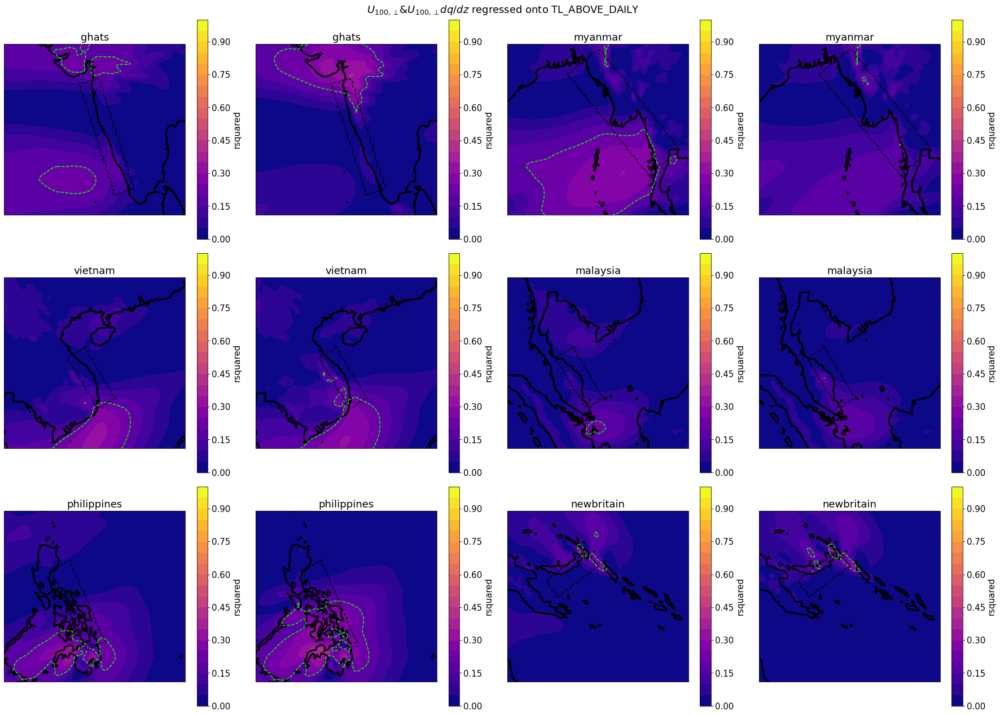

In [46]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'TL_ABOVE_DAILY'
cm = plt.cm.plasma
varnames=[r'$U_{100,\perp}$',r'$U_{100,\perp} dq/dz$']
levs=np.linspace(0,1,21)
for i in range(2):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
        pred = predqL
        
        if i==0:
            var = MR.vars['VAR_100U_PERP_DAILY']#*MR.vars['DQDZ_DAILY'].sel(level=slice(700,899)).mean('level')
        else:
            var = MR.vars['VAR_100U_PERP_DAILY']*MR.vars['DQDZ_DAILY'].sel(level=slice(700,1100)).mean('level')
        reg = linregress_xr_2(pred,var)
    
        plot = reg.rsquared# * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

## Vertical structure of $U_\perp$

In [16]:
%%time
for MR in MRs:
    u = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_131_u.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time')
    v = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_132_v.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time')
    grid = MR.vars['VAR_100U_DAILY']
    umean = spatial_mean(u,box=None,mask=tilted_rect_distance(grid,*MR.box_tilted[:-1],0,-3))
    vmean = spatial_mean(v,box=None,mask=tilted_rect_distance(grid,*MR.box_tilted[:-1],0,-3))
    MR.vars['UPERP_INTERVAL_DAILY'] = crossslopeflow(umean,vmean,MR.angle)
    

CPU times: user 52.6 s, sys: 1min 22s, total: 2min 15s
Wall time: 2min 8s


In [27]:
Newbritain.set_3dvar('PHI',"128_129_z")
sample_geopotential = Newbritain.vars['PHI'].mean(['latitude','longitude'])/9.81
dzdp = sample_geopotential.differentiate('level')


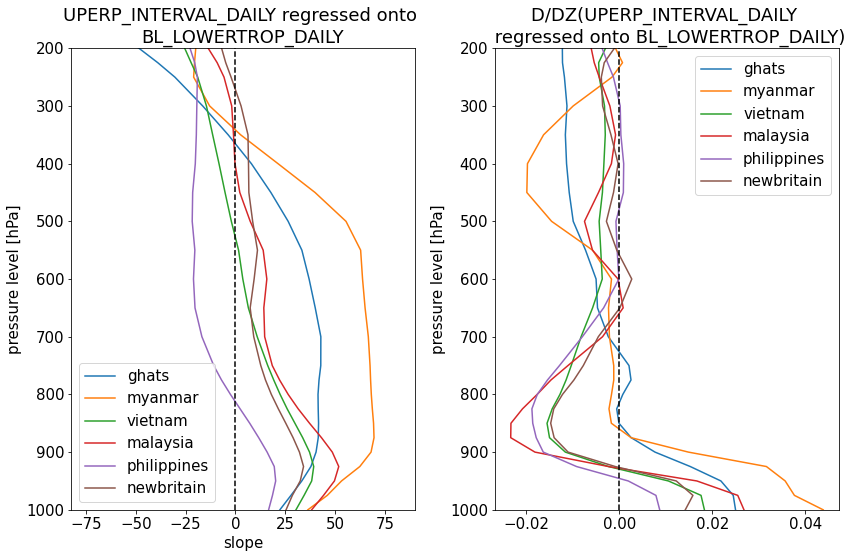

In [36]:
fig,axs = plt.subplots(1,2,figsize=(12,8))
#ax2=axs[0].twiny()
prop_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
for MR,c in zip(MRs,prop_cycle):
    predqL = dBLdqL*(MR.vars['QL_ABOVE_DAILY']-MR.vars['QL_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TL_ABOVE_DAILY']-MR.vars['TL_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = MR.vars['UPERP_INTERVAL_DAILY']
    
    reg = linregress_xr_2(pred,var)

    reg.slope.plot(ax=axs[0],y='level',label=MR.name)
    #reg.rsquared.plot(ax=ax2,y='level',linestyle='--')
    
    plot = reg.slope.differentiate('level')/dzdp #* 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot(ax=axs[1],y='level',label=MR.name)

ax2.set_title('')
ax2.set_xlim(-0.4,0.4)
    
axs[0].set_title('UPERP_INTERVAL_DAILY' + ' regressed onto \n' + 'BL_LOWERTROP_DAILY')
axs[1].set_title('D/DZ(UPERP_INTERVAL_DAILY \n regressed onto BL_LOWERTROP_DAILY)')
for ax in axs:
    ax.set_ylim(1000,200)
    ax.axvline(0.,color='k',linestyle='--')
    ax.legend()
fig.tight_layout()

# Regressions w/ deep variables

## $U_\perp$, $U_{//}$, $T$, $Q$, $e_b$, $PV$

In [60]:
%%time
for MR in MRs:
    u = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_131_u.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time')
    v = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_132_v.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time')
    grid = MR.vars['VAR_100U_DAILY']
    MR.vars['ULFULL_DAILY'] = u.sel(level=slice(700,1100)).mean('level')
    MR.vars['VLFULL_DAILY'] = v.sel(level=slice(700,1100)).mean('level')
    MR.vars['ULFULL_PERP_DAILY'] = crossslopeflow(MR.vars['ULFULL_DAILY'],MR.vars['VLFULL_DAILY'],MR.angle)
    MR.vars['ULFULL_PARA_DAILY'] = crossslopeflow(MR.vars['ULFULL_DAILY'],MR.vars['VLFULL_DAILY'],MR.angle-90) 

CPU times: user 10.2 s, sys: 13.9 s, total: 24.2 s
Wall time: 1min 30s


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py

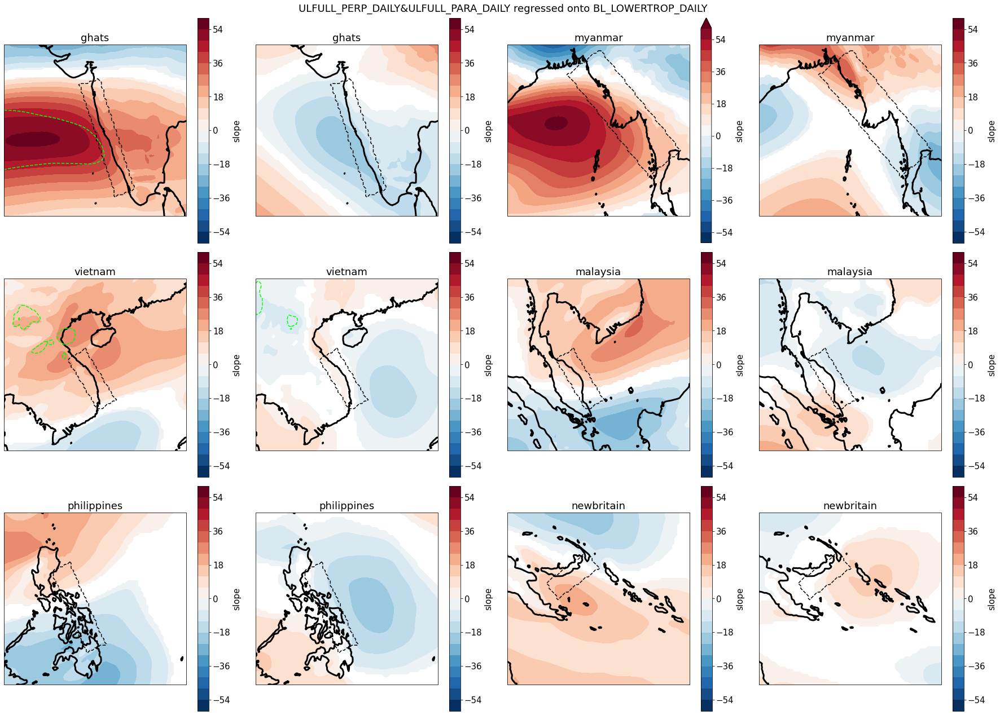

In [61]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.RdBu_r
levs = np.linspace(-60,60,21)
varnames = ['ULFULL_PERP_DAILY','ULFULL_PARA_DAILY']
for i,varname in enumerate(varnames):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        var = MR.vars[varname]
        
        reg = linregress_xr_2(pred,var)
    
        plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

In [ ]:
def add_wind(ax,u,v,color='k',width=0.001,scale=600):
    ax.coastlines()
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = v.longitude.expand_dims({"latitude":u.latitude})
    n=5
    m=5
    q=ax.quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color=color,width=width,scale=scale)
    ax.quiverkey(q, 0.87, 1.03, 10, r'10 m s$^{-1}$', labelpos='E', coordinates='axes',color='k')

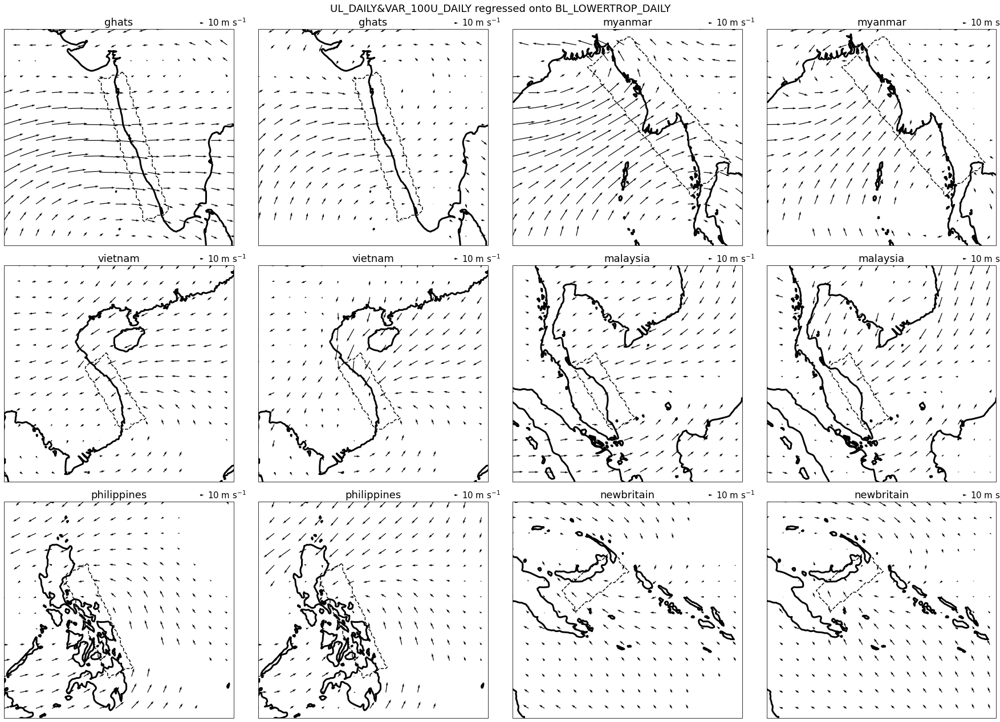

In [62]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.RdBu_r
levs = np.linspace(-60,60,21)
varnames = ['UL_DAILY','VAR_100U_DAILY']
vnss = [['ULFULL_DAILY','VLFULL_DAILY'],['VAR_100U_DAILY','VAR_100V_DAILY']]
for i,vns in enumerate(vnss):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        u = MR.vars[vns[0]];v = MR.vars[vns[1]]
        
        ureg = linregress_xr_2(pred,u)
        vreg = linregress_xr_2(pred,v).slope
        ureg = ureg.slope * 1/(fdr_xr_2d(ureg.pvalue,0.1))
        add_wind(ax,ureg,vreg,width=0.003,scale=600)
        
        
        
        tilted_rect(ureg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)

fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


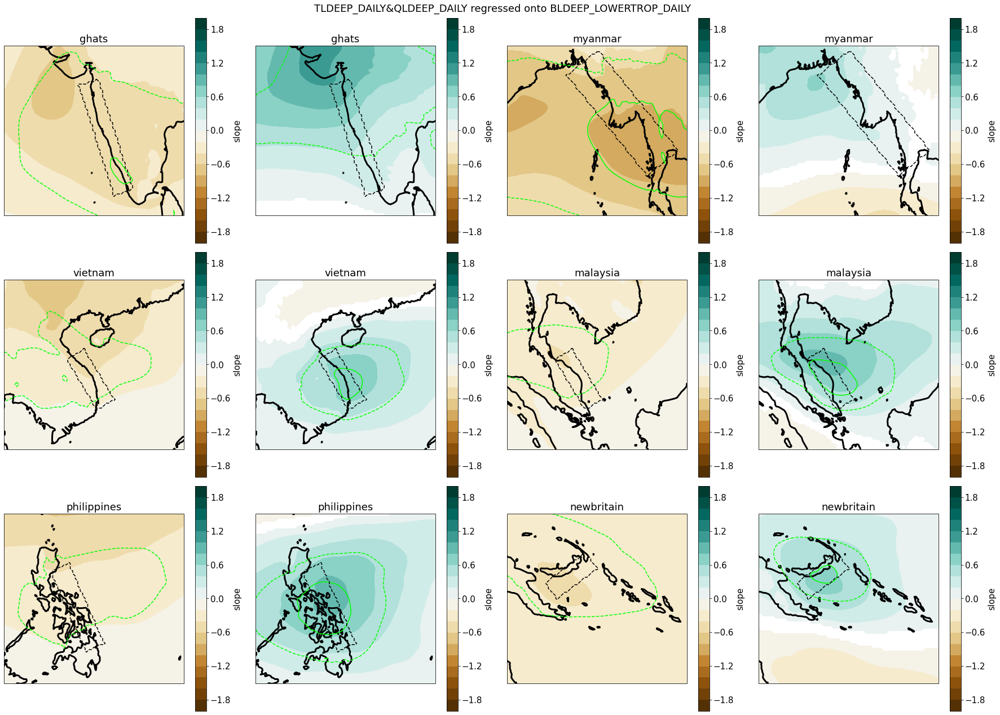

In [49]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BLDEEP_LOWERTROP_DAILY'
cm = plt.cm.BrBG
levs = np.linspace(-2,2,21)
varnames = ['TLDEEP_DAILY','QLDEEP_DAILY']
for i,(varname,fact) in enumerate(zip(varnames,(-dBLdTL,dBLdqL*2.5e3))):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        var = fact*MR.vars[varname]
        
        reg = linregress_xr_2(pred,var)
    
        plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

Text(0.5, 0.98, 'BLDEEP_LOWERTROP_DAILY regressed onto BLDEEP_LOWERTROP_DAILY')

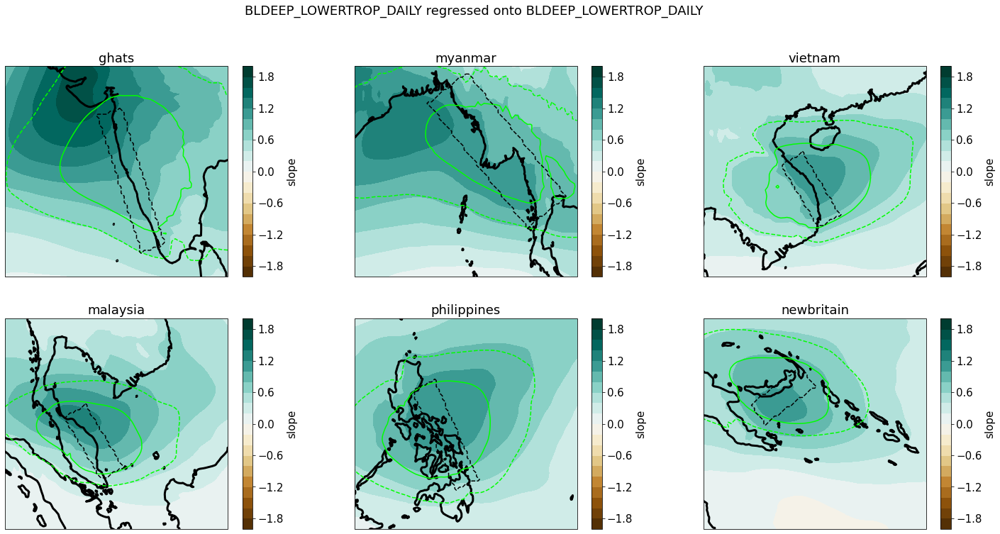

In [50]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BLDEEP_LOWERTROP_DAILY'
varname = 'BLDEEP_LOWERTROP_DAILY'
cm = plt.cm.BrBG
levs = np.linspace(-2,2,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = dBLdTL*MR.vars['TLDEEP_DAILY'] + dBLdqL*2.5e3*MR.vars['QLDEEP_DAILY']
    
    reg = linregress_xr_2(pred,var)

    plot = reg.slope #* 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
    reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname + ' regressed onto ' + predname)
     

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


Text(0.5, 0.98, 'EBDEEP_DAILY regressed onto BLDEEP_LOWERTROP_DAILY')

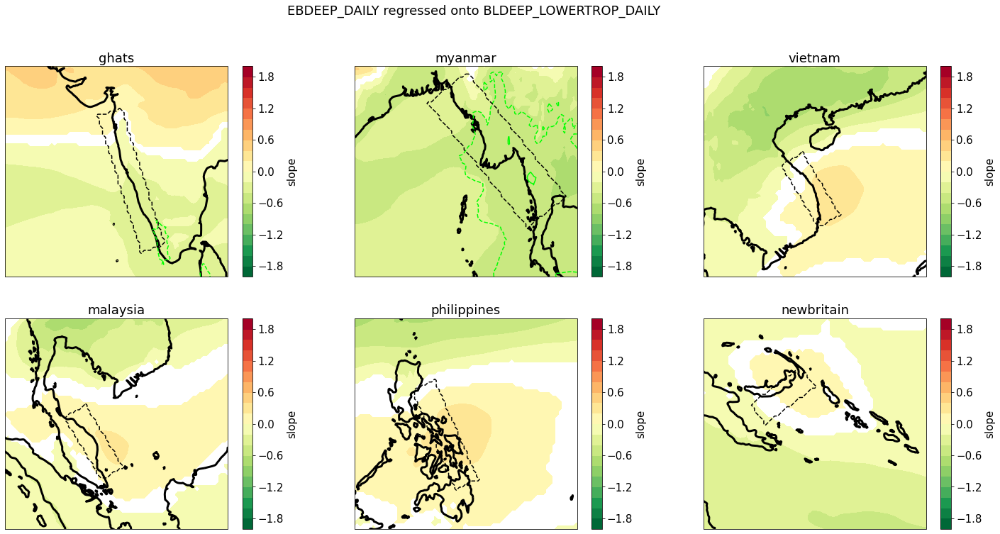

In [51]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'BLDEEP_LOWERTROP_DAILY'
varname = 'EBDEEP_DAILY'
cm = plt.cm.RdYlGn_r
levs = np.linspace(-2,2,21)
for (ax,MR) in zip(axs,MRs):
    predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
    predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
    pred = predqL+predTL
    
    var = dBLdeb*MR.vars[varname]
    
    reg = linregress_xr_2(pred,var)

    plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
    reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname + ' regressed onto ' + predname)
     

In [64]:
for MR in MRs:
    MR.vars['VIWVE_DAILY'] = xr.open_dataarray( MR.path+"e5.oper.an.vinteg.{}.ll025sc.2001-2020.{}.{}.nc".format('162_071_viwve',MR._monthstr,MR.name))
    MR.vars['VIWVN_DAILY'] = xr.open_dataarray( MR.path+"e5.oper.an.vinteg.{}.ll025sc.2001-2020.{}.{}.nc".format('162_072_viwvn',MR._monthstr,MR.name))
    MR.vars['VIWVPERP_DAILY'] = crossslopeflow( MR.vars['VIWVE_DAILY'], MR.vars['VIWVN_DAILY'],MR.angle)

Text(0.5, 0.98, 'VIWVPERP_DAILY regressed onto GPM_PR_ABOVE_DAILY')

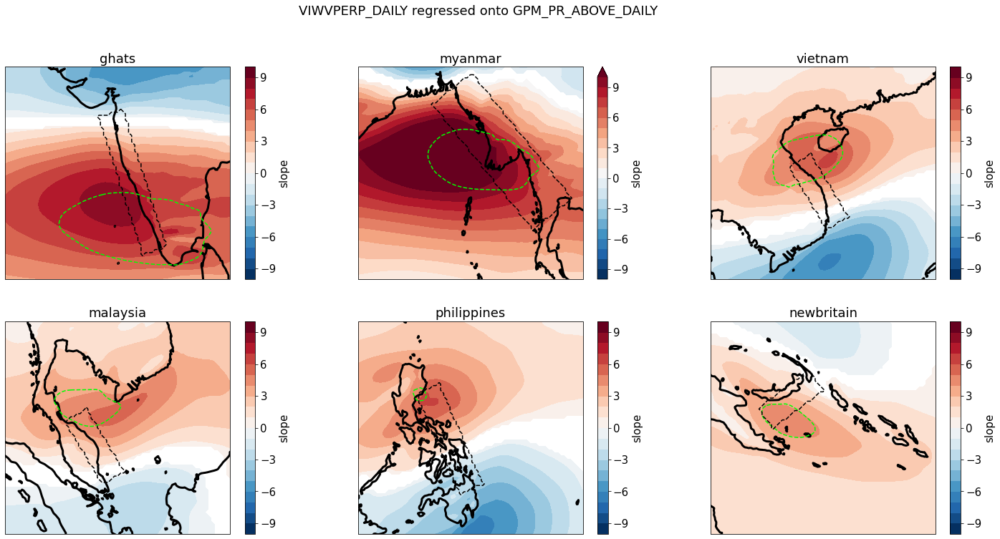

In [69]:
fig,axs = plt.subplots(2,3,figsize=(25,12),subplot_kw={"projection":ccrs.PlateCarree()})
axs=axs.reshape(-1)
predname = 'GPM_PR_ABOVE_DAILY'
varname = 'VIWVPERP_DAILY'
cm = plt.cm.RdBu_r
levs = np.linspace(-10,10,21)
for (ax,MR) in zip(axs,MRs):
    pred = MR.vars[predname]
    var = MR.vars[varname]
    
    reg = linregress_xr_2(pred,var)

    plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
    plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
    reg.rsquared.plot.contour(ax=ax,levels=[0.25,0.5],colors=['lime','lime'],linestyles=['--','-'])
    tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
    ax.coastlines(linewidth=3)
    ax.set_title(MR.name)
fig.suptitle(varname + ' regressed onto ' + predname)
     

## $ds/dz$, $dq/dz$

In [52]:
%%time
Newbritain.set_3dvar('PHI',"128_129_z")
sample_geopotential = Newbritain.vars['PHI'].mean(['latitude','longitude'])/9.81
dzdp = sample_geopotential.differentiate('level')

for MR in MRs:
    MR.vars['DQDZ_DAILY'] = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_133_q.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time').differentiate('level') * 2.5e6/1004. /dzdp
    MR.vars['DSDZ_DAILY'] = xr.open_dataarray("/global/cscratch1/sd/qnicolas/regionsDataBig/e5.oper.an.pl.128_130_t.ll025sc.2001-2020.{}.{}.nc".format(MR._monthstr,MR.name)).sortby('time').differentiate('level') / dzdp + 9.81/1004.

CPU times: user 1min, sys: 1min 29s, total: 2min 30s
Wall time: 2min 22s


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1478: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


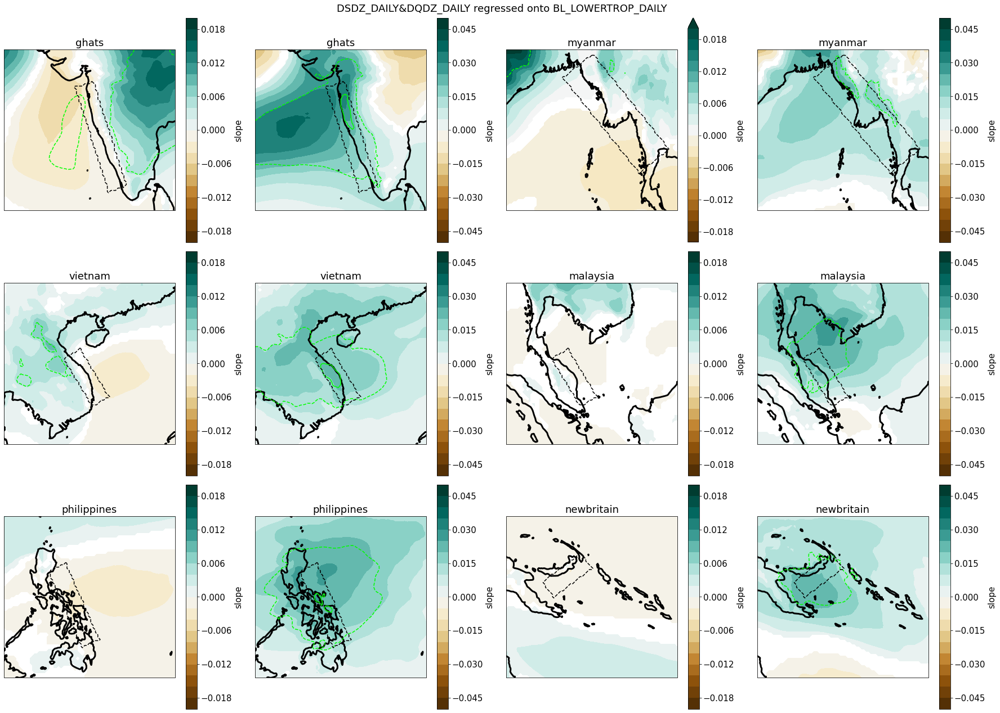

In [58]:
fig,axss = plt.subplots(3,4,figsize=(25,18),subplot_kw={"projection":ccrs.PlateCarree()})
axss=axss.reshape(-1).reshape((6,2))
predname = 'BL_LOWERTROP_DAILY'
cm = plt.cm.BrBG
varnames = ['DSDZ_DAILY','DQDZ_DAILY']
for i,(varname,levs) in enumerate(zip(varnames,(np.linspace(-0.02,0.02,21),np.linspace(-0.05,0.05,21)))):
    axs=axss[:,i].reshape(-1)

    for (ax,MR) in zip(axs,MRs):
        predqL = dBLdqL*(MR.vars['QLDEEP_ABOVE_DAILY']-MR.vars['QLDEEP_ABOVE_DAILY'].mean('time'))*2.5e6/1004. 
        predTL = dBLdTL*(MR.vars['TLDEEP_ABOVE_DAILY']-MR.vars['TLDEEP_ABOVE_DAILY'].mean('time'))
        pred = predqL+predTL
        
        var = MR.vars[varname].sel(level=slice(700,900)).mean('level')
        
        reg = linregress_xr_2(pred,var)
    
        plot = reg.slope * 1/(fdr_xr_2d(reg.pvalue,0.1))
        plot.plot.contourf(ax=ax,cmap=cm,levels=levs)
        reg.rsquared.plot.contour(ax=ax,levels=[0.2,0.5],colors=['lime','lime'],linestyles=['--','-'])
        tilted_rect(reg,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['k'])
        ax.coastlines(linewidth=3)
        ax.set_title(MR.name)
        
fig.suptitle('&'.join(varnames) + ' regressed onto ' + predname)
fig.tight_layout()

# Cascades

In [11]:
%%time
MR = Cascades
print(MR.name)
MR.set_daily_spavg_var('162_071_viwve','VIWVE','vinteg',where='upstream')
MR.set_daily_spavg_var('162_072_viwvn','VIWVN','vinteg',where='upstream')
MR.set_viwvperp_sfc()

MR.set_daily_sfc_var('228_246_100u','VAR_100U')
MR.set_daily_sfc_var('228_247_100v','VAR_100V')
MR.set_uperp_sfc()
MR.vars['VAR_100U_PARA_DAILY'] = crossslopeflow(MR.vars['VAR_100U_DAILY'], MR.vars['VAR_100V_DAILY'],MR.angle-90)

MR.set_daily_uLvL(extra_levels=['900'])
MR.set_uperp_L(MR.angleL,extra_levels=['900'])
MR.vars['UL_PARA_DAILY'] = crossslopeflow(MR.vars['UL_DAILY'], MR.vars['VL_DAILY'],MR.angle-90)

MR.set_daily_imerg()
MR.set_daily_Blsimple_vars()
MR.set_daily_Blsimple_vars('deep')

MR.set_2dvar('SST',era5sst_seasmean)
MR.set_othervar('SST_3D',sel_box(era5sst_monthly,MR.box))

for varname in 'TL','QL','TLDEEP','QLDEEP','EB','EBDEEP','BLSIMPLE','BLDEEPSIMPLE','GPM_PR':
    grid = MR.vars[varname+'_DAILY']
    MR.set_spatialmean(varname,'above',tilted_rect(grid,*MR.box_tilted,reverse=False),box=None)
    MR.set_spatialmean(varname,'rce',tilted_rect_distance(grid,*MR.box_tilted[:-1],-3,-5),box=None)
    MR.set_spatialmean(varname,'closeupstream',tilted_rect_distance(grid,*MR.box_tilted[:-1],-1,-2),box=None)
    
for varname in 'VAR_100U_PERP','UL_PERP','U900_PERP':
    grid = MR.vars['VAR_100U_DAILY']
    MR.set_spatialmean(varname,'interval',tilted_rect_distance(grid,*MR.box_tilted[:-1],0,-3),box=None)
    MR.set_spatialmean(varname,'closeinterval',tilted_rect_distance(grid,*MR.box_tilted[:-1],0,-1),box=None)


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


Text(0.5, 1.0, 'British Columbia cascades 01-11-12')

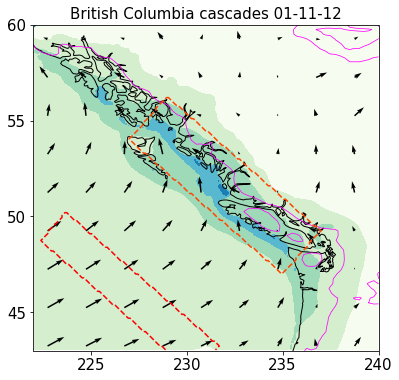

In [20]:
fig,ax = plt.subplots(1,1,figsize=(8,6),subplot_kw={'projection':ccrs.PlateCarree()})
MR=Cascades
ax.set_anchor('W')
ax.coastlines()

box=MR.box
pr=sel_months(sel_box(gpm_pr_seasmean,box),MR.months).mean('month')
pr[0,0]=26.
pr.plot.contourf(ax=ax,transform=ccrs.PlateCarree(),levels=np.arange(0.,26.,5.),cmap=plt.cm.GnBu,add_colorbar=False)

sel_box(orogm,box).plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[500.],linewidths=[0.75],colors=['magenta'])
tilted_rect(pr,*MR.box_tilted).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['orangered'])
tilted_rect_distance(pr,*MR.box_tilted[:-1],-5,-7).plot.contour(ax=ax,levels=[0.5],linestyles=['--'],colors=['red'])

u=sel_months(sel_box(era5100u_monthly,box).groupby('time.month').mean(),MR.months).mean('month')
v=sel_months(sel_box(era5100v_monthly,box).groupby('time.month').mean(),MR.months).mean('month')
X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
Y = u.longitude.expand_dims({"latitude":u.latitude})
n=len(u.latitude)//8
m=n
ibeg=3
iend=-1
Q=ax.quiver(np.array(Y)[ibeg:iend:n,ibeg:iend:n],np.array(X)[ibeg:iend:n,ibeg:iend:n], np.array(u)[ibeg:iend:n,ibeg:iend:n], np.array(v)[ibeg:iend:n,ibeg:iend:n],color="k",transform=ccrs.PlateCarree(),scale=100,scale_units='height',width=1.5,units='dots')


dl=5
lons=range(dl*(1+(int(box[0])-1)//dl),dl*(int(box[1])//dl)+1,dl)
ax.set_xticks([l-360 for l in lons])
ax.set_xticklabels(lons)
lats=range(dl*(1+(int(box[2])-1)//dl),dl*(int(box[3])//dl)+1,dl)
ax.set_yticks(lats)
ax.set_yticklabels(lats)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title(MR.Lname +' '+ MR._monthstr,fontsize=15)


CPU times: user 610 ms, sys: 55.8 ms, total: 666 ms
Wall time: 644 ms


(-0.7, 0.0)

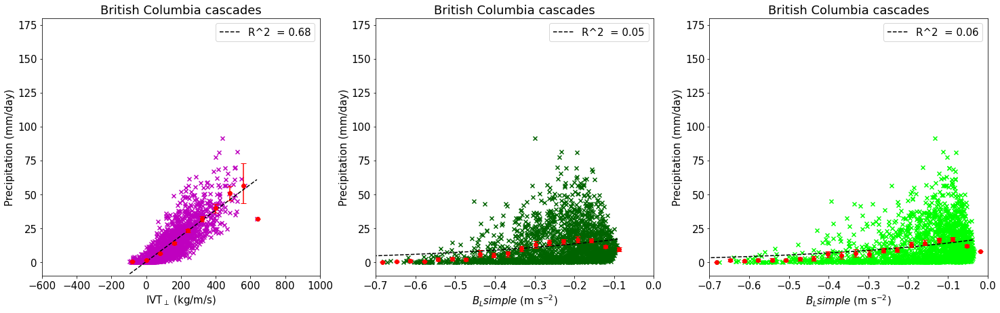

In [27]:
%%time
fig,axs = plt.subplots(1,3,figsize=(25,7))
MR=Cascades
pr = MR.vars['GPM_PR_ABOVE_DAILY']
viwvperp = MR.vars['VIWV_PERP_UPSTREAM_DAILY']
Blsimple = MR.vars['BLSIMPLE_ABOVE_DAILY']
Blsimpledeep = MR.vars['BLDEEPSIMPLE_ABOVE_DAILY']

for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Blsimpledeep,Blsimple),('m','darkgreen','lime'),('linear','exponential','exponential'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
    axs[i].scatter(pred,pr,marker='x',color=c)
    x,y,rsq = fit(pred,pr,model)
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    centers,means,q02,q98 = get_binned(pred,pr,bins,bootstrap=True)
    axs[i].errorbar(centers,means,yerr=[means-q02,q98-means],fmt='or',ecolor='r',capsize=4)
    
    axs[i].set_ylabel("Precipitation (mm/day)")
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    axs[i].set_ylim(-10,180)
axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
axs[1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
axs[2].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
axs[0].set_xlim(-600,1000)
axs[1].set_xlim(-0.7,0)
axs[2].set_xlim(-0.7,0)
    
#fig.suptitle(r"Precipitation vs $B_L$           //           vs $B_{L,\mathrm{simple,deep}}$            //           vs $B_{L,\mathrm{simple}}$",fontsize=30)
#fig.tight_layout(rect=[0, 0, 1, 0.98])

CPU times: user 195 ms, sys: 14.6 ms, total: 210 ms
Wall time: 196 ms


(-0.4, 0.0)

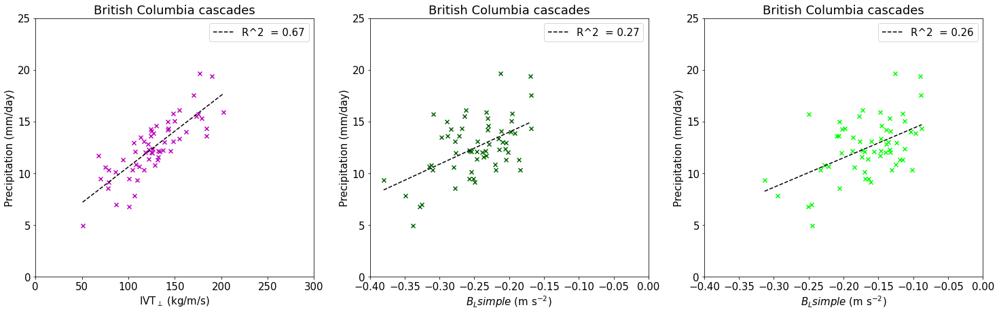

In [31]:
%%time
fig,axs = plt.subplots(1,3,figsize=(25,7))
MR=Cascades
pr           = resample_monthly(MR.vars['GPM_PR_ABOVE_DAILY'])
viwvperp     = resample_monthly(MR.vars['VIWV_PERP_UPSTREAM_DAILY'])
Blsimple     = resample_monthly(MR.vars['BLSIMPLE_ABOVE_DAILY'])
Blsimpledeep = resample_monthly(MR.vars['BLDEEPSIMPLE_ABOVE_DAILY'])

for i,(pred,c,model,bins) in enumerate(zip((viwvperp,Blsimpledeep,Blsimple),('m','darkgreen','lime'),('linear','linear','linear'),(np.linspace(-600,1000,21),np.linspace(-0.7,0,21),np.linspace(-0.7,0,21)))):
    axs[i].scatter(pred,pr,marker='x',color=c)
    x,y,rsq = fit(pred,pr,model)
    axs[i].plot(x,y,color='k',linestyle='--',label='R^2  = %.2f'%rsq)
    axs[i].set_ylabel("Precipitation (mm/day)")
    axs[i].set_title(MR.Lname)
    axs[i].legend()
    axs[i].set_ylim(0,25)
axs[0].set_xlabel(r"IVT$_\perp$ (kg/m/s)")
axs[1].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
axs[2].set_xlabel(r"$B_Lsimple$ (m s$^{-2}$)")
axs[0].set_xlim(0,300)
axs[1].set_xlim(-0.4,0)
axs[2].set_xlim(-0.4,0)
    
#fig.suptitle(r"Precipitation vs $B_L$           //           vs $B_{L,\mathrm{simple,deep}}$            //           vs $B_{L,\mathrm{simple}}$",fontsize=30)
#fig.tight_layout(rect=[0, 0, 1, 0.98])